In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm
from sklearn.model_selection import train_test_split as tts
from sklearn.metrics import r2_score
from sklearn.linear_model import LinearRegression as LR
from sklearn.metrics import mean_squared_error as MSE
from sklearn.model_selection import cross_val_score as CVS
from sklearn.preprocessing import PolynomialFeatures as PF
from sklearn.decomposition import PCA
from sklearn.feature_selection import RFE
from statsmodels.formula.api import ols
from statsmodels.tools.eval_measures import rmse as RMSE
import scipy.stats as stats
import numbers
import pickle
import folium

# Modelling
Modelling requires several different operations. For ease of repetition, I decided to make functions for these operations, with different options for each which could even be used together.    
The different operations and their functions are:     
 - Transform the Data
  - polynom
  - log
  - minmax_plus
  - norm
  - ohe
  - bin_latlong
  - -bin_basement
 - Feature Selection
  - simple_selector
  - stepwise_selector
  - rfe_selector
 - Handling Multicollinearity
  - multicoll_remove
 - Create the Model
  - model
 - Measuring Results
  - metrics
  - unlog

### polynom
This function creates polynomial columns for the features passed in as to_poly. If poly is 'all' it also creates columns for multiplications between the columns passed in. Lastly, though it gets column names from poly.get_feature_names, these have to be altered to make it readable by statsmodels' ols function.

In [2]:
def polynom(data_t, to_poly, poly='all'):
    poly_order = 2
    if poly == 'all':
        poly=PF(poly_order)
        data_poly = poly.fit_transform(data_t[to_poly])
        data_poly = pd.DataFrame(data_poly)
        data_poly.columns = poly.get_feature_names(data_t[to_poly].columns)
        data_t = pd.concat([data_t.drop(to_poly, axis=1),
                            data_poly.drop('1',axis=1)], axis=1)
        data_t.rename(lambda col: col.replace('.0', '').replace(' ','__')
                  .replace('^','_pow_'), axis=1, inplace=True)
    elif poly == 'singles':
        for feat in to_poly:
            df = pd.DataFrame(data_t[feat])
            print(feat)
            poly=PF(poly_order)
            data_poly = poly.fit_transform(df)
            data_poly = pd.DataFrame(data_poly)
            data_poly.columns = ['drop', feat, feat + '_squared']
            data_t = pd.concat([data_t.drop(feat, axis=1), 
                                data_poly.drop('drop',axis=1)], axis=1)
    return data_t 

### log
log simply replaces the data with the log of the data for the columns passed in as to_log

In [3]:
def log(data_t, to_log):
    for feat in to_log:
        data_t[feat] = data_t[feat].map(lambda x: np.log(x) if x!=0 else 0)
        #Note 'if' included so that 0 values wouldn't error, will still error
        #...between 0 and 1. Also, implies that the original 0 value was a 1
        #...but as these are around values of 100s, 1000s, the effect is minimal
    return data_t 

### norm
For each column in to_norm, if this isn't the test data, norm calculates its mean and stdev, using them to normalise the column's values. It then records the statistics used for each column so they can be used later for the test data.   
If this is test data (test=True) it reads the stats from the record made previously

In [4]:
def norm(data_t, to_norm, test=False):
    stats = {}
    if test:
        with open('norm_stats.pickle', 'rb') as f:
            stats = pickle.load(f)
    for feat in to_norm:
        ft = data_t[feat]
        if test:
            mean = stats[feat][0]
            stdev = stats[feat][1]
        else:
            mean = np.mean(ft)
            stdev = np.std(ft)
        data_t[feat] = (ft-mean) / stdev
        #record stats used:
        stats[feat] = [mean, stdev]
    if not test:
        with open('norm_stats.pickle', 'wb') as f:
            pickle.dump(stats, f)
    return data_t 


### minmax_plus
This function performs min-max scaling on the columns in to_minmax, and also  multiplies by 100, and adds 1 to,each value to make them log-able. It records the stats used for the train-data and reads it for test-data, in the same way as norm.

In [5]:
def minmax_plus(data_t, to_minmax, test=False):
    stats = {}
    if test:
        with open('minmax_stats.pickle', 'rb') as f:
            stats = pickle.load(f)
    for feat in to_minmax:
        ft = data_t[feat]
        if test:
            min_ = stats[feat][0]
            max_ = stats[feat][1]
        else:
            min_ = ft.min()
            max_ = ft.max()
        data_t[feat] = 1 + 100*(ft-min_)/(max_-min_)
        #record stats used:
        stats[feat] = [min_, max_]
    with open('minmax_stats.pickle', 'wb') as f:
        pickle.dump(stats, f)
    return data_t 


### ohe
ohe gets dummies for the columns in to_ohe, drops the original, and adds these columns to the dataframe. Lastly, the column names have to be altered to make it readable by statsmodels' ols function.

In [6]:
def ohe(data_t, to_ohe):
    for feat in to_ohe:
        dummies = pd.get_dummies(data=data_t[feat], prefix=feat, prefix_sep='_',
                                drop_first=True)
        data_t.drop(feat, axis=1, inplace=True)
        data_t = pd.concat([data_t, dummies], axis=1)
    data_t.rename(lambda col: col.replace('.0', '').replace(' ','__')
                  .replace('^','_pow_'),
                  axis=1, inplace=True)
    return data_t 


### bin_latlong
Calculates (or looks up if it's test data) 5 equal divisions in each of lat and long. Then, for each row, it uses floor division by the bin size to calculate which bin the lat-long belongs in. The bin number increases by latitude first and then by longitude.

In [7]:
def bin_latlong(data_t, test=False):
    
    if not test:
        max_lat = data_t['lat'].max()
        min_lat = data_t['lat'].min()
        x=(max_lat - min_lat)/5

        max_long = data_t['long'].max()
        min_long = data_t['long'].min()
        y=(max_long - min_long)/5
        #record stats used:
        latlong_vals = [x, min_lat, y, min_long]
        with open('latlong_vals.pickle', 'wb') as f:
            pickle.dump(latlong_vals, f)
    else:
        with open('latlong_vals.pickle', 'rb') as f:
            latlong_vals = pickle.load(f)
        x = latlong_vals[0]
        min_lat = latlong_vals[1]
        y = latlong_vals[2]
        min_long = latlong_vals[3]
    
    
    data_t.loc[:,'lat_long'] = data_t.apply(lambda row: (row.lat-min_lat)//x
                                      + 5*(row.long-min_long)//y, axis=1)
    
    
    
    return data_t

### bin_basement 
Sets basement to 1 if it has a basement, otherwise it remains 0

In [8]:
def bin_basement(data_t):
    data_t.sqft_basement = data_t.sqft_basement.apply(lambda x: 
                                                      1 if not x else 0)
    return data_t

### simple_selector
simple_selector starts by calling the model function, which returns a model using all the features in x_cols. Only the features in x_cols with a pvalue lower than or equal to alpha are kept and returned.

In [9]:
def simple_selector(data_s, x_cols, alpha=0.1):
    
    results = model(data_s, x_cols)
    pv = pd.DataFrame(results.pvalues).drop('Intercept')
    pv.rename(columns={0:'p_value'}, inplace=True)
    x_cols = list(pv[pv.p_value <= alpha].index)
    
    return x_cols

### stepwise_selector
This function loops adding or removing features depending on their pvalue each iteration; breaking out of the loop when stable.

In [10]:
def stepwise_selector(data_s, 
                       x_cols=[], 
                       alpha=0.05, 
                       verbose=False):
    """ 
    Perform a forward-backward feature selection 
    based on p-value from statsmodels.api.OLS
    Arguments:
        X - pandas.DataFrame with candidate features
        y - list-like with the target
        x_cols - list of features to start with (column names of X)
        threshold_in - include a feature if its p-value < threshold_in
        threshold_out - exclude a feature if its p-value > threshold_out
        verbose - whether to print the sequence of inclusions and exclusions
    Returns: list of selected features 
    Always set threshold_in < threshold_out to avoid infinite looping.
    See https://en.wikipedia.org/wiki/Stepwise_regression for the details
    """
    
    X = data_s[x_cols]
    y = data_s['price']
    threshold_in = alpha - 0.02
    threshold_out = alpha + 0.02
    included = list(x_cols)
    while True:
        print(len(included))
        changed=False
        # forward step
        excluded = list(set(X.columns)-set(included))
        new_pval = pd.Series(index=excluded)
        for new_column in excluded:
            results = sm.OLS(y, sm.add_constant
                             (pd.DataFrame(X[included+[new_column]]))).fit()
            new_pval[new_column] = results.pvalues[new_column]
        best_pval = new_pval.min()
        if best_pval < threshold_in:
            best_feature = new_pval.idxmin()
            included.append(best_feature)
            changed=True
            if verbose:
                print('Add  {:30} with p-value {:.6}'.format(best_feature, best_pval))

        # backward step
        results = sm.OLS(y, sm.add_constant(pd.DataFrame(X[included]))).fit()
        # use all coefs except intercept
        pvalues = results.pvalues.iloc[1:]
        worst_pval = pvalues.max() # null if pvalues is empty
        if worst_pval > threshold_out:
            changed=True
            worst_feature = pvalues.idxmax()
            included.remove(worst_feature)
            if verbose:
                print('Drop {:30} with p-value {:.6}'.format(worst_feature, 
                                                             worst_pval))
        if not changed:
            break
            
    return included

### rfe_selector
Here features are selected using sklearn's recursive-feature-elimination function for a range of numbers-of-features. Models are created for each set of features and the adjusted r-squared is plotted against the number of features. Using this graph, and the list of results, you can choose how many features you want to select. Enter this number when asked and it will call this function again. But this time specifying the number of features to select and returning with the selected features.     
Note: tried using mpld3 to show y-values when hovering over markers but couldn't get the graph to appear before asking for input.

In [11]:
def rfe_selector(data_s, x_cols, nfts=None):
    X = data_s[x_cols]
    y = data_s[outcome]
    linreg = LR()
    r2_adj = []
    
    #if the desired n_features_to_select value is known, go straight to selecting with that, otherwise start at 1
    n = nfts or 1
    #don't select more than the number of features, or 80 at most
    n_max = min(len(x_cols), 80)
    r = range(n, n_max+1)
    while n <= n_max:
        
        selector = RFE(linreg, n_features_to_select=n)
        results = selector.fit(X, y)
        
        #Can I use a metric from sklearn here, then move the for loop into the if below it?
        
        #add column name from list (x_cols) if RFE selected it
        new_cols = []
        for i in range(len(x_cols)):
            if results.support_[i]:
                new_cols.append(x_cols[i])
        
        #append score for graphing
        results = model(data_s, new_cols)
        r2_adj.append(results.rsquared_adj)
        if nfts:
            return new_cols
        n+=1
    #show scores and graph for choosing the number of features to select
    print(list(zip(r, r2_adj)))
    fig, ax = plt.subplots()
    lines = ax.plot(r, r2_adj, marker='o')
    ax.set(xlabel='Number of Features', ylabel='Adj. R^2', 
           title = 'Select Number of Features');
    
    plt.show(block=False)
    
    
    
    print('Select number of features')
    choice = int(input())
    new_cols = rfe_selector(data_s, x_cols, nfts=choice)
    
    return new_cols

### Multicoll_remove    
This function removes a feature from each pair with high multicollinearity    
This function takes in the data, x_cols and the threshold for removing a feature

- create a dataframe of the correlation of the features in x_cols   
- transform this to get a list of pairs of features with high multicollinearity
- for each pair: check whether they are the same feature or if one of the features has already been listed to be removed; if so, continue to next pair 
- otherwise add the feature with the higher p-value to a list    
- remove the features in this list from x_cols    


return x_cols     




In [12]:
def multicoll_remove(data_mr, x_cols, multicollinearity_threshold):
    
    pvalues = model(data_mr, x_cols).pvalues
    corr = data_mr[x_cols].corr().abs().stack().reset_index().sort_values(0,
                                                            ascending = False)
    corr['pairs'] = list(zip(corr.level_0, corr.level_1))
    corr = corr.set_index('pairs').drop(['level_0', 'level_1'], axis=1)
    corr.columns = ['cc']
    corr = corr[corr.cc > multicollinearity_threshold]        

    to_drop = []
    for f0, f1 in corr.index:
        if (f0 == f1) | any(feat in [f0, f1] for feat in to_drop):
            continue
        to_drop.append(pvalues.loc[[f0, f1]]
                       .sort_values(ascending=False).index[0])
    x_cols = list(set(x_cols) - set(to_drop))
    return x_cols   

### metrics
metrics creates two graphs:
- a qqplot
- a residuals plot for homoscedasticity

In [13]:
def metrics(data_m, results, x_cols):
#     X = data[x_cols]
#     y = data.price
#     to_pred = pd.concat([y,X], axis=1)
#     yhat = results.predict(to_pred)
#     rmse = RMSE(y, yhat)
    
#     linreg = LR()
#     linreg.fit(X,y)
#     cv  = np.mean(CVS(linreg, X, y, cv=5,  scoring='neg_mean_squared_error'))
#     rmse = (-cv)**0.5
      
#     print(f'RMSE: {rmse}')
    print(f'Number of features: {len(x_cols)}')
    
    fig = plt.figure(figsize=(14,14))
    ax1 = fig.add_subplot(211)
    sm.graphics.qqplot(results.resid, dist=stats.norm, line='45',
                             fit=True, alpha=0.1, ax=ax1)
    ax1.set(title='QQPlot')
    ax1.set(xlim=(-6, 6), ylim=(-7.5, 7.5))
    
    ax2 = fig.add_subplot(212)
    plt.scatter(data_m.price, results.resid, alpha=0.5);
    plt.hlines(0, xmax=data_m.price.max(), xmin=data_m.price.min()); 
#     ax2.title.set_text('Residuals Plot for Homoscedasticity')
    ax2.set(xlabel='Fitted', ylabel='Residuals', 
       title = 'Residuals Plot for Homoscedasticity');

## model
A small function to create a model using statsmodels' OLS function

In [14]:
def model(data_m, x_cols):
    
    predictors = '+'.join(x_cols)
    f = outcome + '~' + predictors
    results = ols(formula=f, data=data_m).fit()
    return results

### unlog


In [15]:
def unlog(y):
    y = y.map(lambda x: np.e**x)
    return y

# Main

## Load, Join and Split:

In [16]:
data = pd.read_csv('data/clean.csv')
df = pd.read_csv('data/distances.csv')
data = pd.concat([data, df],axis=1)


data = data[data.price < 1000000]
data.sort_index(axis=1, inplace=True)
data_train, data_test = tts(data, train_size=0.8, random_state=111)
data_train = data_train.reset_index().drop('index', axis=1)
data_test = data_test.reset_index().drop('index', axis=1)



##  Modelling

Initial model using only cleaned data:

Number of features: 36


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.785
Model:                            OLS   Adj. R-squared:                  0.785
Method:                 Least Squares   F-statistic:                     1604.
Date:                Tue, 01 Dec 2020   Prob (F-statistic):               0.00
Time:                        10:51:04   Log-Likelihood:            -2.0305e+05
No. Observations:               15824   AIC:                         4.062e+05
Df Residuals:                   15787   BIC:                         4.065e+05
Df Model:                          36                                         
Covariance Type:            nonrobust                                         
====================================================================================
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
Intercept        -1.182e+08   4.87e+06    -24.292      0.000   -1.28e+08   -1.09e+08
Abandoned        -4131.0726    354.950    -11.638      0.000   -4826.815   -3435.331
Access_Point     -6363.7088    281.261    -22.626      0.000   -6915.013   -5812.404
Airport           -167.4957    307.199     -0.545      0.586    -769.641     434.650
Campground        3761.7398    249.134     15.099      0.000    3273.409    4250.071
Cemetery          -487.7177    513.632     -0.950      0.342   -1494.494     519.059
Commercial_Farm  -2887.6648    430.895     -6.702      0.000   -3732.269   -2043.061
Cultural          5824.9896    612.173      9.515      0.000    4625.061    7024.918
Educational       1.722e+04   1075.534     16.015      0.000    1.51e+04    1.93e+04
Fire              1879.2814    666.500      2.820      0.005     572.866    3185.697
Gate_wo_Building -1.088e+04    542.686    -20.048      0.000   -1.19e+04   -9816.289
Gated_w_Building  9499.8348    254.467     37.332      0.000    9001.050    9998.619
Government       -1.029e+04   1056.108     -9.745      0.000   -1.24e+04   -8221.418
Lodging           4664.6963    635.221      7.343      0.000    3419.591    5909.801
Police            4011.2048    266.250     15.066      0.000    3489.325    4533.084
Public_Gathering  2702.3145   1474.465      1.833      0.067    -187.806    5592.435
Seasonal_Home    -4568.1764    361.342    -12.642      0.000   -5276.447   -3859.905
Utility           1842.0637   1608.313      1.145      0.252   -1310.413    4994.540
bathroomsx4       3579.3032    447.042      8.007      0.000    2703.050    4455.556
bedrooms         -5964.7190   1082.574     -5.510      0.000   -8086.688   -3842.750
condition         2.725e+04   1243.899     21.909      0.000    2.48e+04    2.97e+04
date                87.7155      6.412     13.681      0.000      75.148     100.283
floorsx2         -1208.8242   1036.973     -1.166      0.244   -3241.410     823.761
grade             4.632e+04   1225.348     37.801      0.000    4.39e+04    4.87e+04
lat               2.387e+05   2.13e+04     11.199      0.000    1.97e+05     2.8e+05
long             -8.852e+05   4.07e+04    -21.726      0.000   -9.65e+05   -8.05e+05
sqft_above          42.5919     10.320      4.127      0.000      22.363      62.821
sqft_basement        5.8718     10.212      0.575      0.565     -14.145      25.889
sqft_living         55.1441     10.337      5.335      0.000      34.882      75.406
sqft_living15       48.1394      2.078     23.163      0.000      44.066      52.213
sqft_lot             0.3178      0.038      8.384      0.000       0.244       0.392
sqft_lot15          -0.2487      0.105     -2.380      0.017      -0.454      -0.044
view              2.408e+04   1304.170     18.466      0.000    2.15e+04    2.66e+04
waterfront        1.682

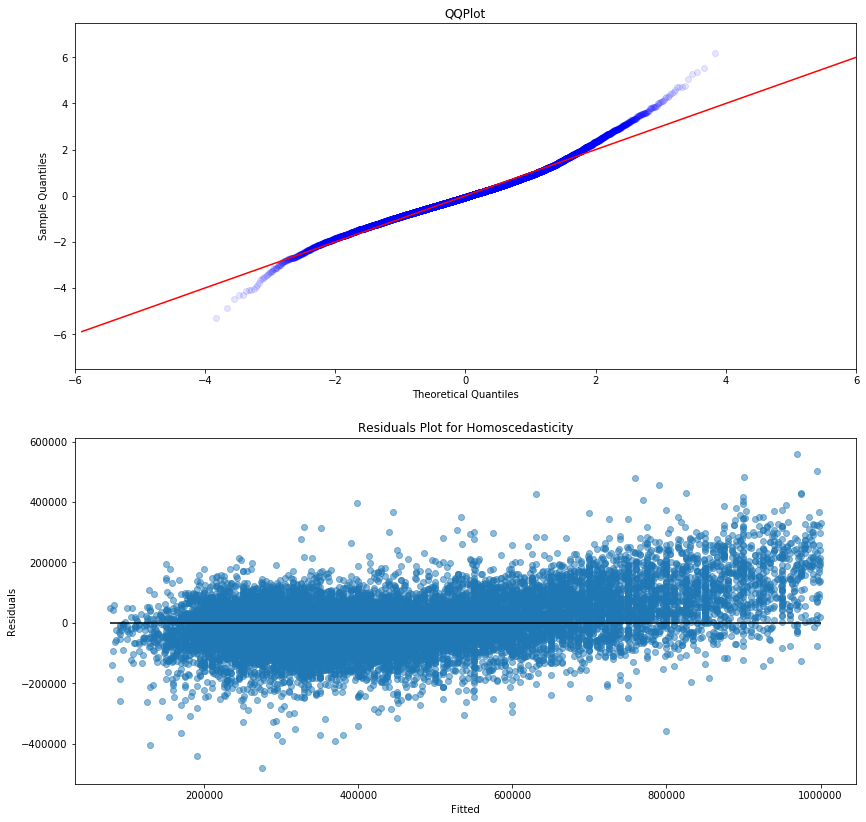

In [17]:
outcome = 'price'
x_cols = data_train.drop([outcome], axis=1).columns

results = model(data_train, x_cols)

metrics(data_train, results, x_cols)
results.summary()

Number of features: 29


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.785
Model:                            OLS   Adj. R-squared:                  0.785
Method:                 Least Squares   F-statistic:                     1991.
Date:                Tue, 01 Dec 2020   Prob (F-statistic):               0.00
Time:                        10:51:07   Log-Likelihood:            -2.0306e+05
No. Observations:               15824   AIC:                         4.062e+05
Df Residuals:                   15794   BIC:                         4.064e+05
Df Model:                          29                                         
Covariance Type:            nonrobust                                         
====================================================================================
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
Intercept        -1.192e+08   3.27e+06    -36.442      0.000   -1.26e+08   -1.13e+08
Abandoned        -4205.6967    326.236    -12.892      0.000   -4845.157   -3566.236
Access_Point     -6400.4273    267.745    -23.905      0.000   -6925.237   -5875.617
Campground        3791.9113    214.273     17.697      0.000    3371.912    4211.911
Commercial_Farm  -2884.2634    426.114     -6.769      0.000   -3719.496   -2049.031
Cultural          5876.0593    602.683      9.750      0.000    4694.732    7057.387
Educational       1.754e+04   1016.699     17.257      0.000    1.56e+04    1.95e+04
Fire              2128.1176    645.532      3.297      0.001     862.802    3393.433
Gate_wo_Building -1.092e+04    517.163    -21.121      0.000   -1.19e+04   -9909.418
Gated_w_Building  9326.3998    196.537     47.454      0.000    8941.166    9711.634
Government       -9663.2701   1005.400     -9.611      0.000   -1.16e+04   -7692.570
Lodging           4673.7518    585.631      7.981      0.000    3525.849    5821.655
Police            3938.3773    240.281     16.391      0.000    3467.398    4409.356
Seasonal_Home    -4626.2854    292.964    -15.791      0.000   -5200.528   -4052.043
bathroomsx4       3442.1117    434.061      7.930      0.000    2591.304    4292.920
bedrooms         -5952.6091   1081.097     -5.506      0.000   -8071.682   -3833.536
condition         2.737e+04   1237.457     22.120      0.000    2.49e+04    2.98e+04
date                87.6013      6.411     13.664      0.000      75.035     100.167
grade             4.624e+04   1223.329     37.800      0.000    4.38e+04    4.86e+04
lat               2.328e+05   2.04e+04     11.429      0.000    1.93e+05    2.73e+05
long             -8.982e+05   3.28e+04    -27.369      0.000   -9.62e+05   -8.34e+05
sqft_above          35.3458      2.226     15.881      0.000      30.983      39.709
sqft_living         61.8571      2.451     25.234      0.000      57.052      66.662
sqft_living15       48.3362      2.058     23.483      0.000      44.302      52.371
sqft_lot             0.3188      0.038      8.414      0.000       0.245       0.393
sqft_lot15          -0.1987      0.102     -1.942      0.052      -0.399       0.002
view              2.409e+04   1297.063     18.573      0.000    2.15e+04    2.66e+04
waterfront        1.685e+05    1.5e+04     11.229      0.000    1.39e+05    1.98e+05
yr_built         -1551.7235     72.482    -21.408      0.000   -1693.796   -1409.651
yr_renovated       758.4209     73.184     10.363      0.000     614.972     901.870
==============================================================================
Omnibus:                     1070.159   Durbin-Watson:                   2.014
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             2195.329
Skew:                           0.464   P

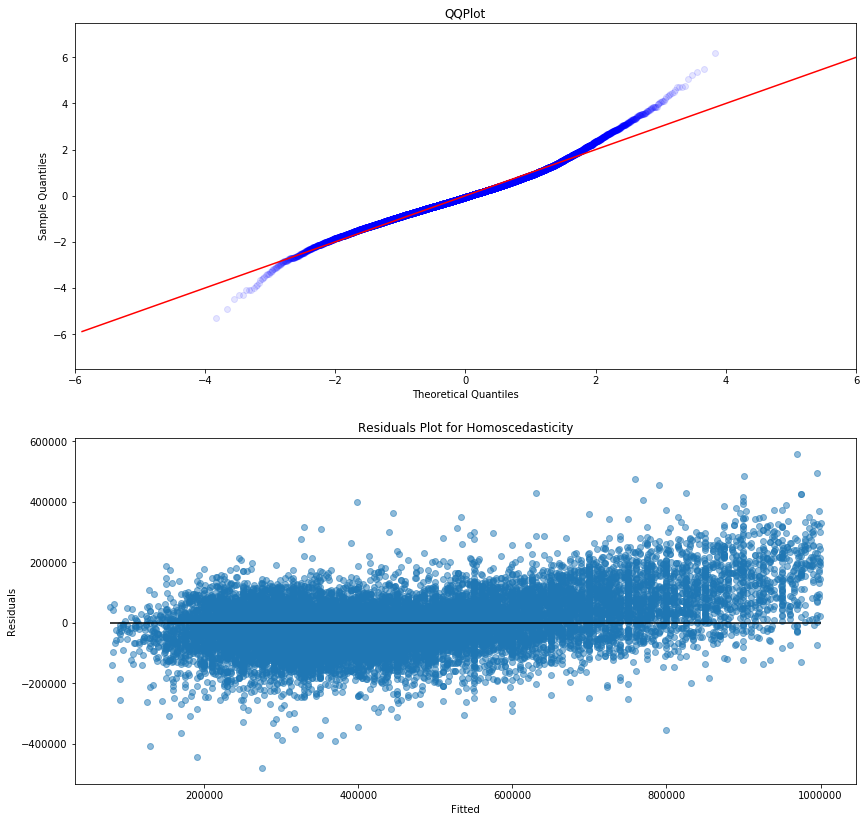

In [18]:
#simple feature selection
alpha=0.05
outcome = 'price'

data_t = data_train.copy()
x_cols = data_t.drop([outcome], axis=1).columns

x_cols = simple_selector(data_t, x_cols, alpha=alpha)

results = model(data_t, x_cols)
metrics(data_t, results, x_cols)
results.summary()

Number of features: 23


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.756
Model:                            OLS   Adj. R-squared:                  0.755
Method:                 Least Squares   F-statistic:                     2127.
Date:                Tue, 01 Dec 2020   Prob (F-statistic):               0.00
Time:                        10:51:10   Log-Likelihood:            -2.0407e+05
No. Observations:               15824   AIC:                         4.082e+05
Df Residuals:                   15800   BIC:                         4.084e+05
Df Model:                          23                                         
Covariance Type:            nonrobust                                         
====================================================================================
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
Intercept         -2.05e+07   1.29e+06    -15.839      0.000    -2.3e+07    -1.8e+07
sqft_lot             0.2360      0.040      5.855      0.000       0.157       0.315
Educational      -3172.9688    751.159     -4.224      0.000   -4645.326   -1700.612
Abandoned        -3969.6935    341.364    -11.629      0.000   -4638.807   -3300.580
long              9.518e+04   9391.553     10.135      0.000    7.68e+04    1.14e+05
lat               6.992e+05   7297.081     95.822      0.000    6.85e+05    7.14e+05
bedrooms         -6351.2985   1129.178     -5.625      0.000   -8564.616   -4137.981
Lodging           8638.9962    607.969     14.210      0.000    7447.308    9830.684
sqft_living        109.4069      1.792     61.038      0.000     105.894     112.920
Police            2891.8186    233.295     12.396      0.000    2434.534    3349.103
Campground        2078.6132    220.447      9.429      0.000    1646.512    2510.714
grade             6.442e+04   1217.761     52.904      0.000     6.2e+04    6.68e+04
waterfront        1.842e+05    1.6e+04     11.536      0.000    1.53e+05    2.15e+05
Government       -5103.8641   1063.992     -4.797      0.000   -7189.410   -3018.318
Gated_w_Building  1.032e+04    204.252     50.512      0.000    9916.726    1.07e+04
Commercial_Farm  -4446.9171    452.198     -9.834      0.000   -5333.277   -3560.557
sqft_lot15           0.0464      0.108      0.428      0.668      -0.166       0.259
yr_built          -768.2531     37.061    -20.729      0.000    -840.897    -695.609
Fire              -161.0795    677.678     -0.238      0.812   -1489.405    1167.246
Cultural          1.007e+04    629.808     15.993      0.000    8837.951    1.13e+04
condition         2.358e+04   1285.127     18.345      0.000    2.11e+04    2.61e+04
date                82.7368      6.829     12.116      0.000      69.351      96.122
view              2.443e+04   1358.362     17.985      0.000    2.18e+04    2.71e+04
Access_Point     -7170.4618    270.379    -26.520      0.000   -7700.435   -6640.489
==============================================================================
Omnibus:                     1047.866   Durbin-Watson:                   2.033
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             1980.260
Skew:                           0.480   Prob(JB):                         0.00
Kurtosis:                       4.443   Cond. No.                     4.71e+07
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 4.71e+07. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

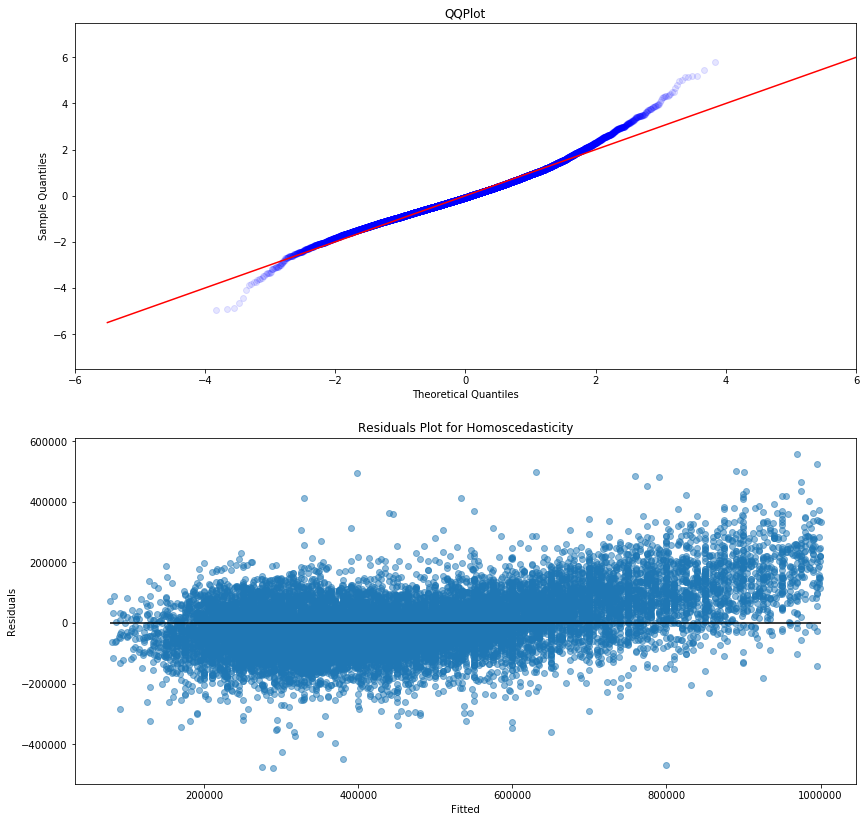

In [19]:
#simple feature selection with multicollinearity removal
multicollinearity_threshold=0.7
alpha=0.05
outcome = 'price'

data_t = data_train.copy()
x_cols = data_t.drop([outcome], axis=1).columns

x_cols = simple_selector(data_t, x_cols, alpha=alpha)
x_cols = multicoll_remove(data_t, x_cols, multicollinearity_threshold)

results = model(data_t, x_cols)
metrics(data_t, results, x_cols)
results.summary()

Number of features: 28


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.749
Model:                            OLS   Adj. R-squared:                  0.749
Method:                 Least Squares   F-statistic:                     1686.
Date:                Tue, 01 Dec 2020   Prob (F-statistic):               0.00
Time:                        10:51:13   Log-Likelihood:            -2.0428e+05
No. Observations:               15824   AIC:                         4.086e+05
Df Residuals:                   15795   BIC:                         4.088e+05
Df Model:                          28                                         
Covariance Type:            nonrobust                                         
====================================================================================
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
Intercept        -7.167e+06   2.07e+06     -3.460      0.001   -1.12e+07   -3.11e+06
sqft_lot             0.3611      0.035     10.212      0.000       0.292       0.430
long              6.489e+04   1.01e+04      6.395      0.000     4.5e+04    8.48e+04
lat               6.301e+05   9000.393     70.008      0.000    6.12e+05    6.48e+05
sqft_basement       13.3155      2.470      5.391      0.000       8.474      18.157
Lodging           6593.3667    656.691     10.040      0.000    5306.177    7880.557
Campground        3168.6897    261.670     12.109      0.000    2655.786    3681.594
Access_Point     -6464.7172    288.697    -22.393      0.000   -7030.596   -5898.839
grade             6.812e+04   1229.631     55.402      0.000    6.57e+04    7.05e+04
Gated_w_Building  8454.0197    241.492     35.007      0.000    7980.667    8927.372
Airport           2678.0814    302.692      8.848      0.000    2084.770    3271.392
Commercial_Farm  -3821.9780    459.519     -8.317      0.000   -4722.688   -2921.268
yr_built         -1261.7360     42.685    -29.560      0.000   -1345.403   -1178.069
view              2.341e+04   1408.227     16.626      0.000    2.07e+04    2.62e+04
Educational      -1583.4235    795.970     -1.989      0.047   -3143.616     -23.231
Abandoned        -4508.7842    364.638    -12.365      0.000   -5223.516   -3794.053
bedrooms          9733.6332   1088.292      8.944      0.000    7600.456    1.19e+04
floorsx2           1.03e+04   1079.293      9.544      0.000    8185.304    1.24e+04
Police            2191.9310    254.540      8.611      0.000    1693.004    2690.858
waterfront        1.932e+05   1.62e+04     11.910      0.000    1.61e+05    2.25e+05
Government       -7922.6148   1119.206     -7.079      0.000   -1.01e+04   -5728.843
sqft_living15       88.6635      2.006     44.204      0.000      84.732      92.595
Fire             -1428.4286    693.205     -2.061      0.039   -2787.189     -69.669
bathroomsx4       9436.4842    458.346     20.588      0.000    8538.074    1.03e+04
Cultural          6895.7193    644.013     10.707      0.000    5633.380    8158.058
Public_Gathering  5339.8054   1530.975      3.488      0.000    2338.919    8340.692
condition         2.513e+04   1325.414     18.958      0.000    2.25e+04    2.77e+04
zipcode           -131.8522     19.958     -6.606      0.000    -170.973     -92.731
date                85.7698      6.923     12.389      0.000      72.200      99.340
==============================================================================
Omnibus:                     1052.101   Durbin-Watson:                   2.015
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             1830.450
Skew:                           0.507   Prob(JB):                         0.00
Kurtosis:                       4.322   Cond. N

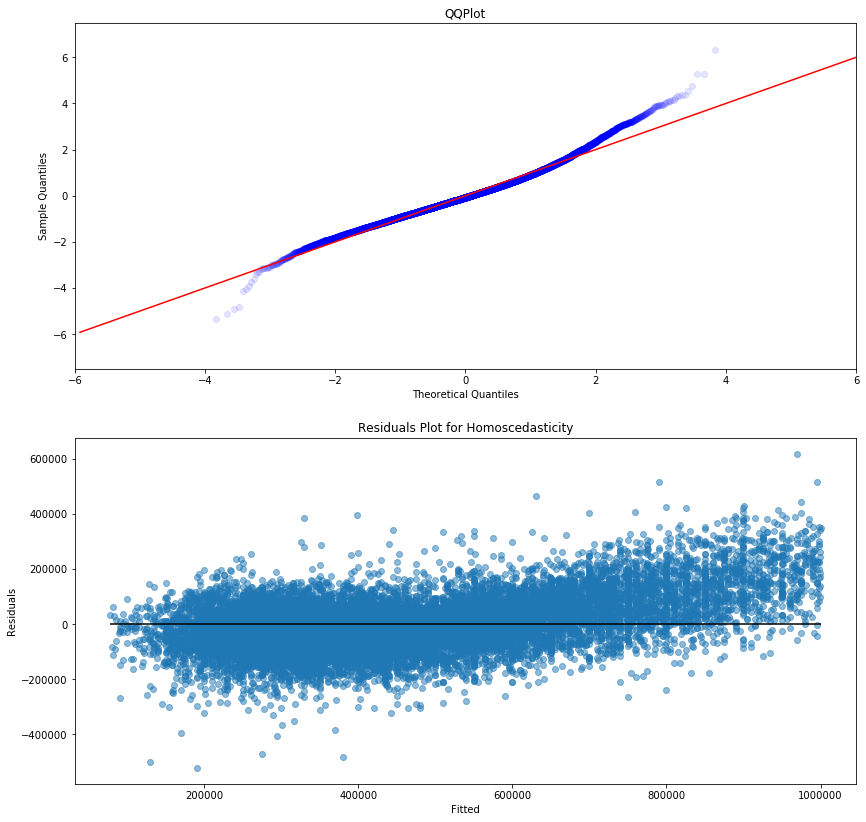

In [20]:
multicollinearity_threshold=0.7
alpha=0.05
outcome = 'price'

data_t = data_train.copy()
x_cols = data_t.drop([outcome], axis=1).columns


x_cols = multicoll_remove(data_t, x_cols, multicollinearity_threshold)
x_cols = simple_selector(data_t, x_cols)

results = model(data_t, x_cols)
metrics(data_t, results, x_cols)
results.summary()

Running the simple_selector before multicoll_remove is definitely performing better -removes more features and has a higher adj. R^2.
Though running multicoll_remove either way is dropping the R^2, it should be making it more reliable.

## What to Transform?
### One-Hot-Encoding

Candidates for OHE:
 - bedrooms
 - bathroomsx4
 - floorsx2
 - view
 - condition
 - grade
 - lat_long

Next, for each of the features above, I one-hot-encode it, run it through simple feature selection, model it, and compare the results. It needs to have a significant impact if I'm to transform it in the final model as it has to be worth the increase in columns. Note, only shows results if adj. R^2 is higher than the basemodel.

Number of features: 28


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.749
Model:                            OLS   Adj. R-squared:                  0.749
Method:                 Least Squares   F-statistic:                     1686.
Date:                Tue, 01 Dec 2020   Prob (F-statistic):               0.00
Time:                        10:51:16   Log-Likelihood:            -2.0428e+05
No. Observations:               15824   AIC:                         4.086e+05
Df Residuals:                   15795   BIC:                         4.088e+05
Df Model:                          28                                         
Covariance Type:            nonrobust                                         
====================================================================================
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
Intercept        -7.167e+06   2.07e+06     -3.460      0.001   -1.12e+07   -3.11e+06
sqft_lot             0.3611      0.035     10.212      0.000       0.292       0.430
long              6.489e+04   1.01e+04      6.395      0.000     4.5e+04    8.48e+04
lat               6.301e+05   9000.393     70.008      0.000    6.12e+05    6.48e+05
sqft_basement       13.3155      2.470      5.391      0.000       8.474      18.157
Lodging           6593.3667    656.691     10.040      0.000    5306.177    7880.557
Campground        3168.6897    261.670     12.109      0.000    2655.786    3681.594
Access_Point     -6464.7172    288.697    -22.393      0.000   -7030.596   -5898.839
grade             6.812e+04   1229.631     55.402      0.000    6.57e+04    7.05e+04
Gated_w_Building  8454.0197    241.492     35.007      0.000    7980.667    8927.372
Airport           2678.0814    302.692      8.848      0.000    2084.770    3271.392
Commercial_Farm  -3821.9780    459.519     -8.317      0.000   -4722.688   -2921.268
yr_built         -1261.7360     42.685    -29.560      0.000   -1345.403   -1178.069
view              2.341e+04   1408.227     16.626      0.000    2.07e+04    2.62e+04
Educational      -1583.4235    795.970     -1.989      0.047   -3143.616     -23.231
Abandoned        -4508.7842    364.638    -12.365      0.000   -5223.516   -3794.053
bedrooms          9733.6332   1088.292      8.944      0.000    7600.456    1.19e+04
floorsx2           1.03e+04   1079.293      9.544      0.000    8185.304    1.24e+04
Police            2191.9310    254.540      8.611      0.000    1693.004    2690.858
waterfront        1.932e+05   1.62e+04     11.910      0.000    1.61e+05    2.25e+05
Government       -7922.6148   1119.206     -7.079      0.000   -1.01e+04   -5728.843
sqft_living15       88.6635      2.006     44.204      0.000      84.732      92.595
Fire             -1428.4286    693.205     -2.061      0.039   -2787.189     -69.669
bathroomsx4       9436.4842    458.346     20.588      0.000    8538.074    1.03e+04
Cultural          6895.7193    644.013     10.707      0.000    5633.380    8158.058
Public_Gathering  5339.8054   1530.975      3.488      0.000    2338.919    8340.692
condition         2.513e+04   1325.414     18.958      0.000    2.25e+04    2.77e+04
zipcode           -131.8522     19.958     -6.606      0.000    -170.973     -92.731
date                85.7698      6.923     12.389      0.000      72.200      99.340
==============================================================================
Omnibus:                     1052.101   Durbin-Watson:                   2.015
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             1830.450
Skew:                           0.507   Prob(JB):                         0.00
Kurtosis:                       4.322   Cond. N

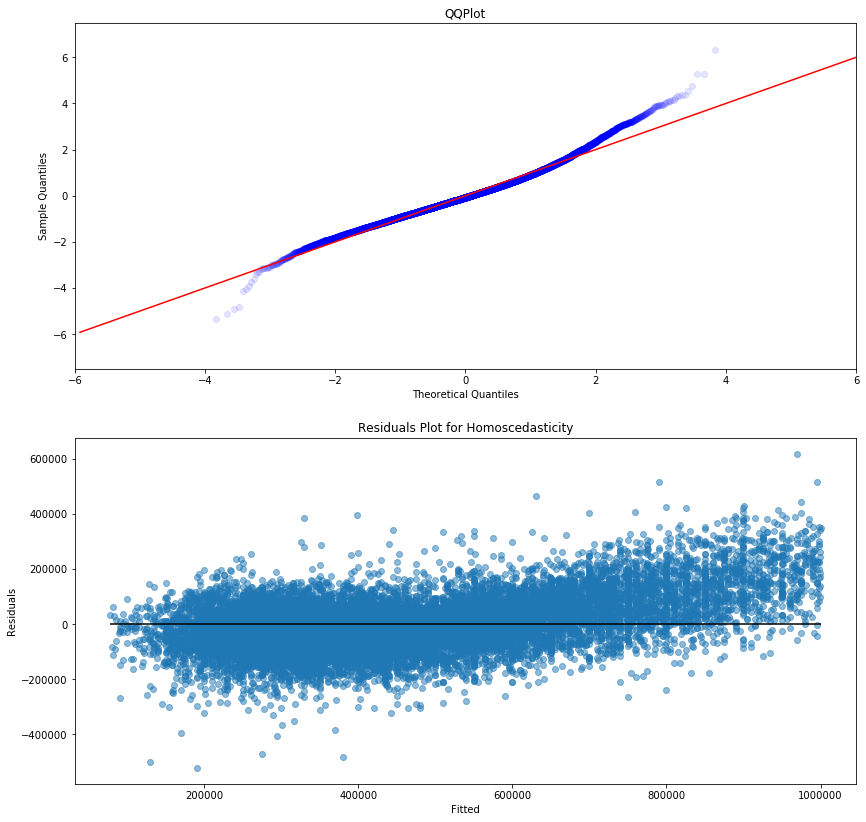

In [21]:
#Base model to compare against
multicollinearity_threshold=0.7
alpha=0.1
outcome = 'price'

data_t = data_train.copy()
x_cols = data_t.drop([outcome], axis=1).columns
x_cols = multicoll_remove(data_t, x_cols, multicollinearity_threshold)
x_cols = simple_selector(data_t, x_cols)

results = model(data_t, x_cols)
metrics(data_t, results, x_cols)
results.summary()

Number of features: 33
bedrooms
                            OLS Regression Results                            
Dep. Variable:                  price   R-squared:                       0.750
Model:                            OLS   Adj. R-squared:                  0.749
Method:                 Least Squares   F-statistic:                     1434.
Date:                Tue, 01 Dec 2020   Prob (F-statistic):               0.00
Time:                        10:51:19   Log-Likelihood:            -2.0427e+05
No. Observations:               15824   AIC:                         4.086e+05
Df Residuals:                   15790   BIC:                         4.089e+05
Df Model:                          33                                         
Covariance Type:            nonrobust                                         
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
Intercep

Number of features: 31
view
                            OLS Regression Results                            
Dep. Variable:                  price   R-squared:                       0.750
Model:                            OLS   Adj. R-squared:                  0.750
Method:                 Least Squares   F-statistic:                     1529.
Date:                Tue, 01 Dec 2020   Prob (F-statistic):               0.00
Time:                        10:51:25   Log-Likelihood:            -2.0426e+05
No. Observations:               15824   AIC:                         4.086e+05
Df Residuals:                   15792   BIC:                         4.088e+05
Df Model:                          31                                         
Covariance Type:            nonrobust                                         
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
Intercept   

strong multicollinearity or other numerical problems.


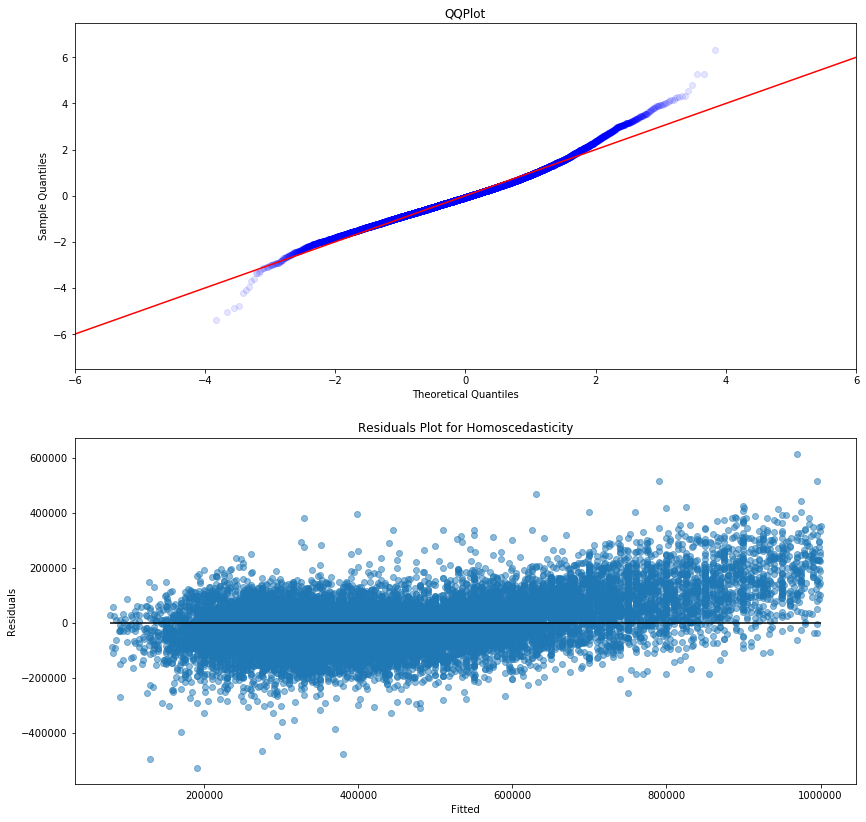

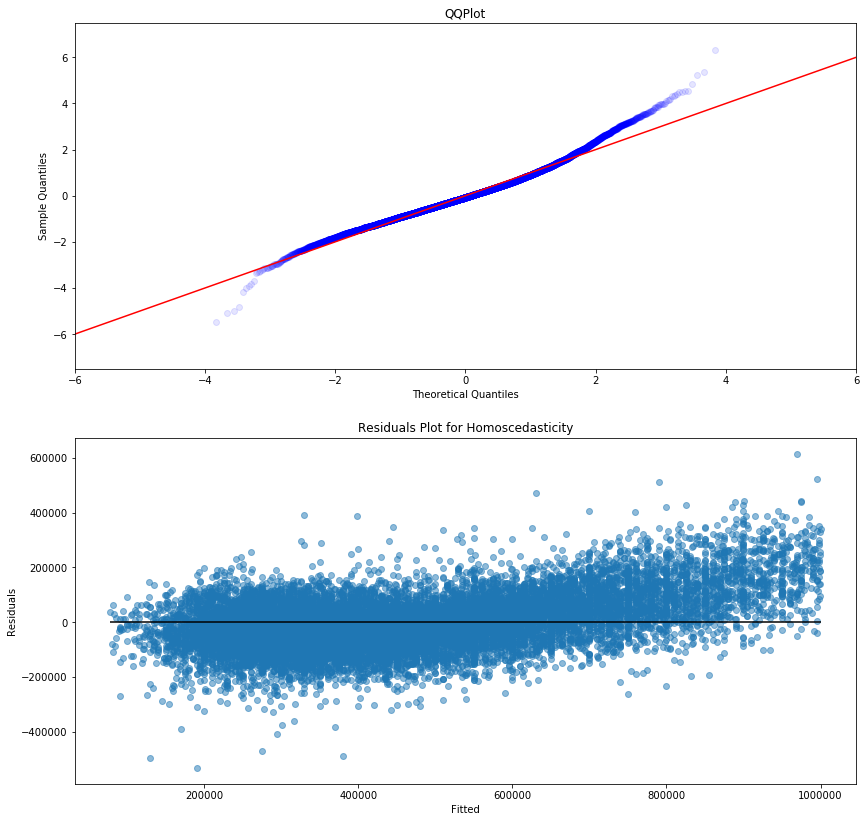

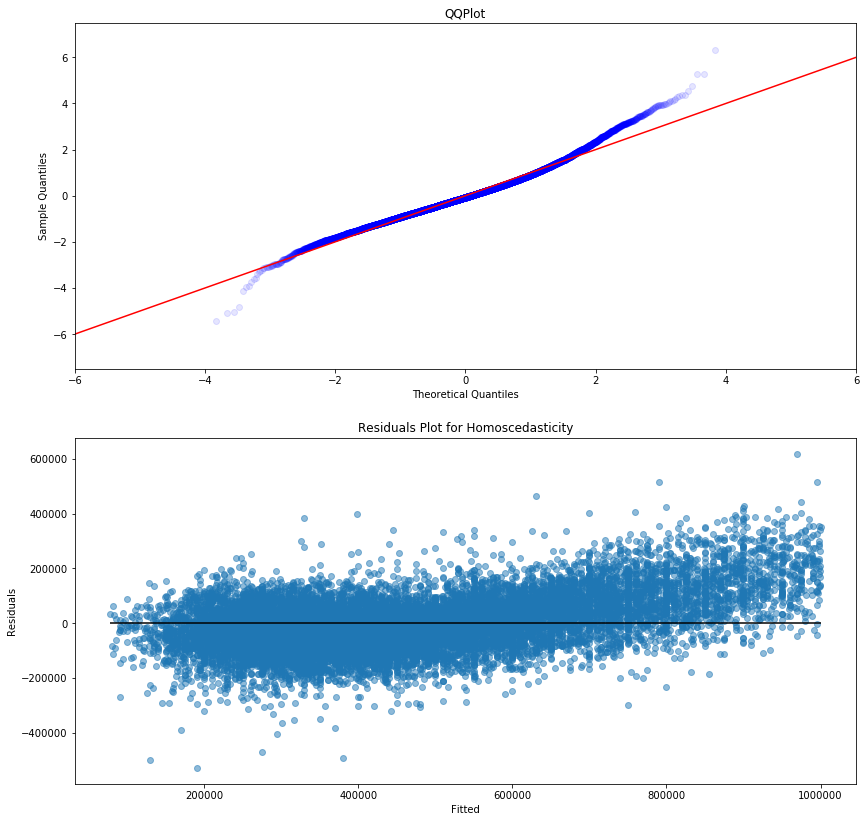

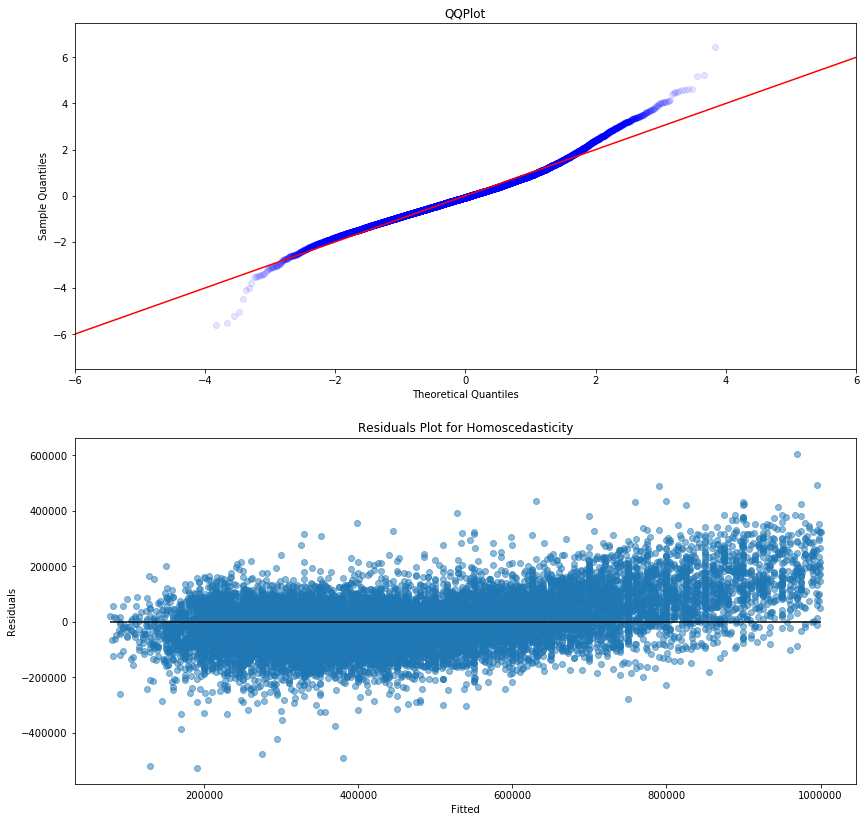

In [22]:
#Run models to ohe each ohe candidate separately:
multicollinearity_threshold=0.7
alpha=0.1
cand_ohe = ['bedrooms', 'bathroomsx4', 'floorsx2', 'view', 'condition', 'grade',
           'lat_long']

for feat in cand_ohe:
    data_t = data_train.copy()
    if feat == 'lat_long':
        data_t = bin_latlong(data_t)
    to_ohe = [feat]
    data_t = ohe(data_t, to_ohe)
    x_cols = data_t.drop([outcome], axis=1).columns
    x_cols = multicoll_remove(data_t, x_cols, multicollinearity_threshold)
    x_cols = simple_selector(data_t, x_cols)

    
    results = model(data_t, x_cols)
    if results.rsquared_adj > 0.749:
        metrics(data_t, results, x_cols)
        print(feat)
        print(results.summary())

The only OHE candidate that made any significant improvement was the binned lat_long feature

### Log 

As above but for log transforms. Note, the score increase only needs to be large enough to make the decrease in interpretability worthwhile.

Number of features: 26
Gate_wo_Building
                            OLS Regression Results                            
Dep. Variable:                  price   R-squared:                       0.753
Model:                            OLS   Adj. R-squared:                  0.753
Method:                 Least Squares   F-statistic:                     1853.
Date:                Tue, 01 Dec 2020   Prob (F-statistic):               0.00
Time:                        10:51:46   Log-Likelihood:            -2.0416e+05
No. Observations:               15824   AIC:                         4.084e+05
Df Residuals:                   15797   BIC:                         4.086e+05
Df Model:                          26                                         
Covariance Type:            nonrobust                                         
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------


Number of features: 28
Public_Gathering
                            OLS Regression Results                            
Dep. Variable:                  price   R-squared:                       0.749
Model:                            OLS   Adj. R-squared:                  0.749
Method:                 Least Squares   F-statistic:                     1688.
Date:                Tue, 01 Dec 2020   Prob (F-statistic):               0.00
Time:                        10:51:49   Log-Likelihood:            -2.0428e+05
No. Observations:               15824   AIC:                         4.086e+05
Df Residuals:                   15795   BIC:                         4.088e+05
Df Model:                          28                                         
Covariance Type:            nonrobust                                         
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------


Number of features: 28
floorsx2
                            OLS Regression Results                            
Dep. Variable:                  price   R-squared:                       0.750
Model:                            OLS   Adj. R-squared:                  0.749
Method:                 Least Squares   F-statistic:                     1691.
Date:                Tue, 01 Dec 2020   Prob (F-statistic):               0.00
Time:                        10:51:52   Log-Likelihood:            -2.0427e+05
No. Observations:               15824   AIC:                         4.086e+05
Df Residuals:                   15795   BIC:                         4.088e+05
Df Model:                          28                                         
Covariance Type:            nonrobust                                         
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
Intercep

Number of features: 28
sqft_lot
                            OLS Regression Results                            
Dep. Variable:                  price   R-squared:                       0.751
Model:                            OLS   Adj. R-squared:                  0.751
Method:                 Least Squares   F-statistic:                     1703.
Date:                Tue, 01 Dec 2020   Prob (F-statistic):               0.00
Time:                        10:51:55   Log-Likelihood:            -2.0422e+05
No. Observations:               15824   AIC:                         4.085e+05
Df Residuals:                   15795   BIC:                         4.087e+05
Df Model:                          28                                         
Covariance Type:            nonrobust                                         
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
Intercep

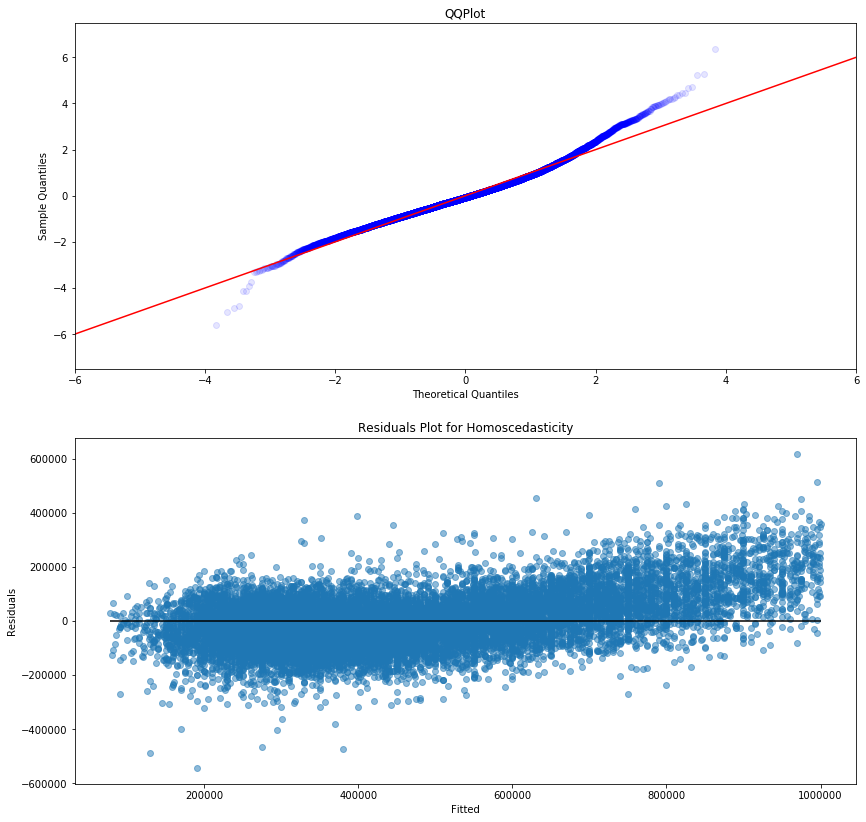

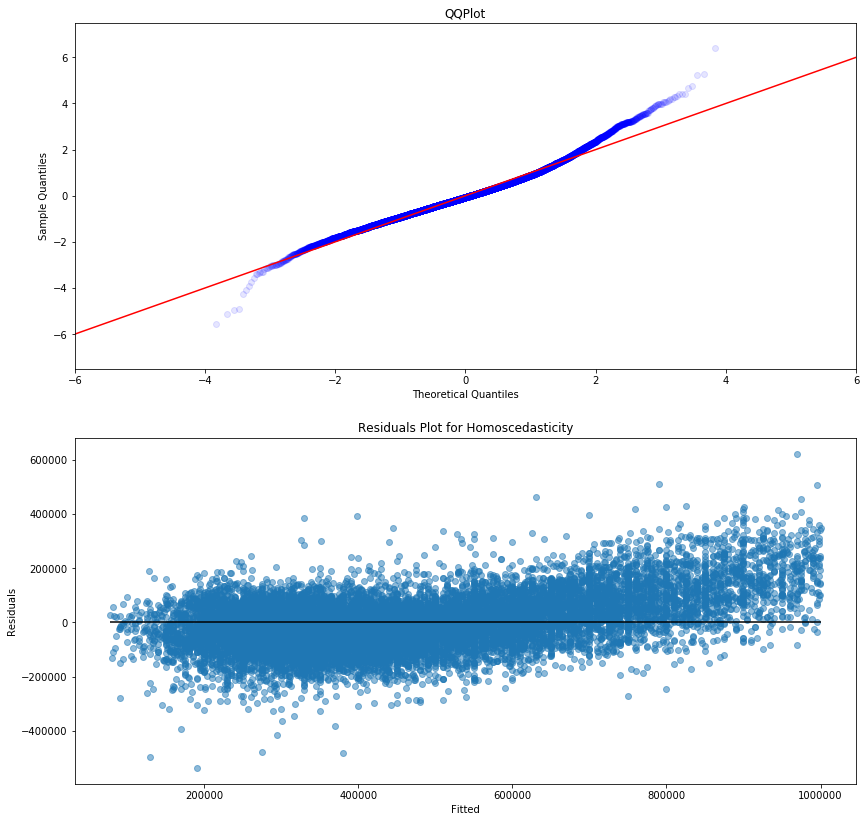

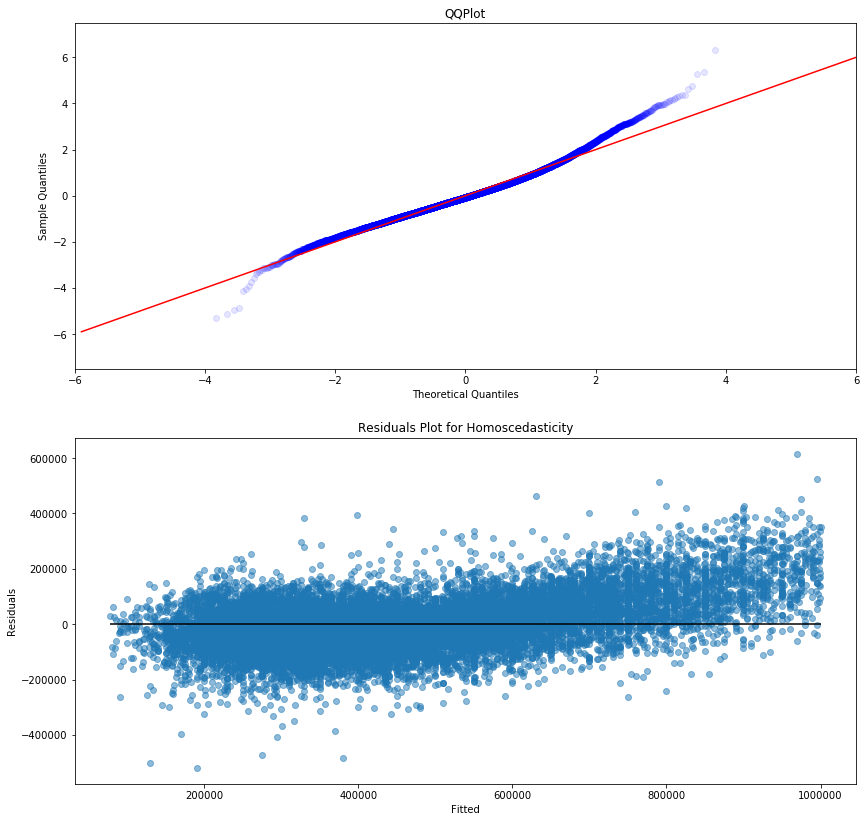

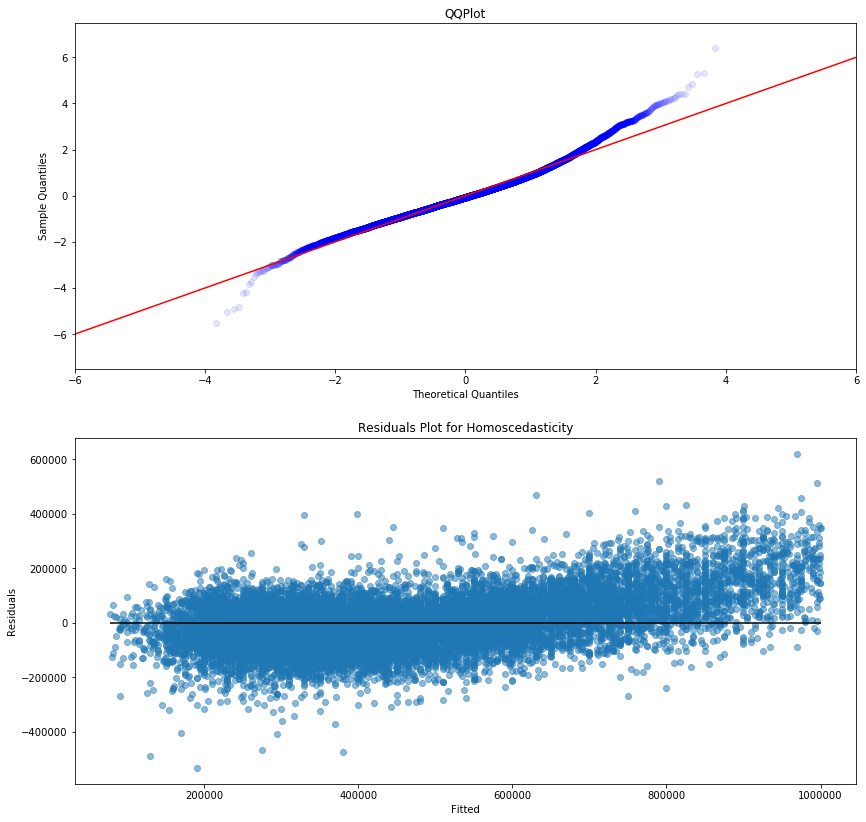

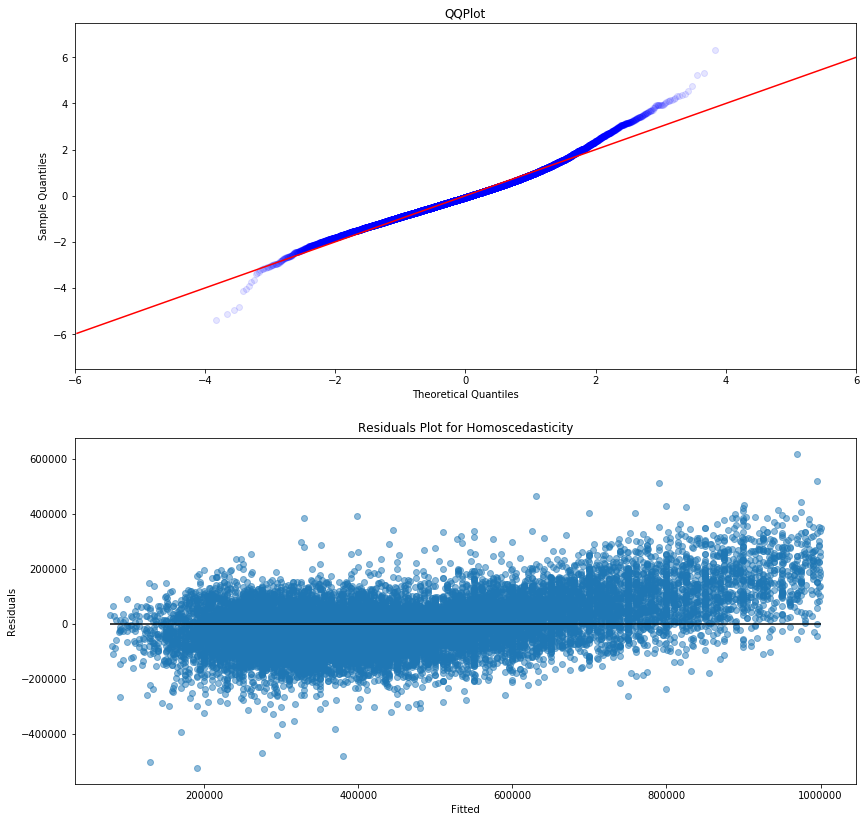

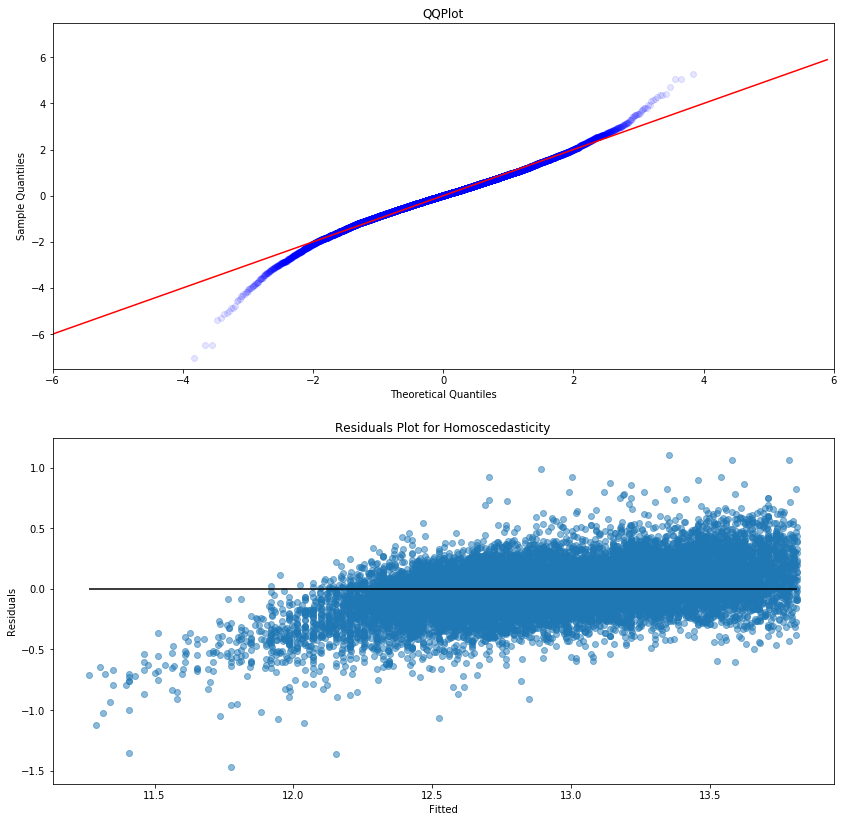

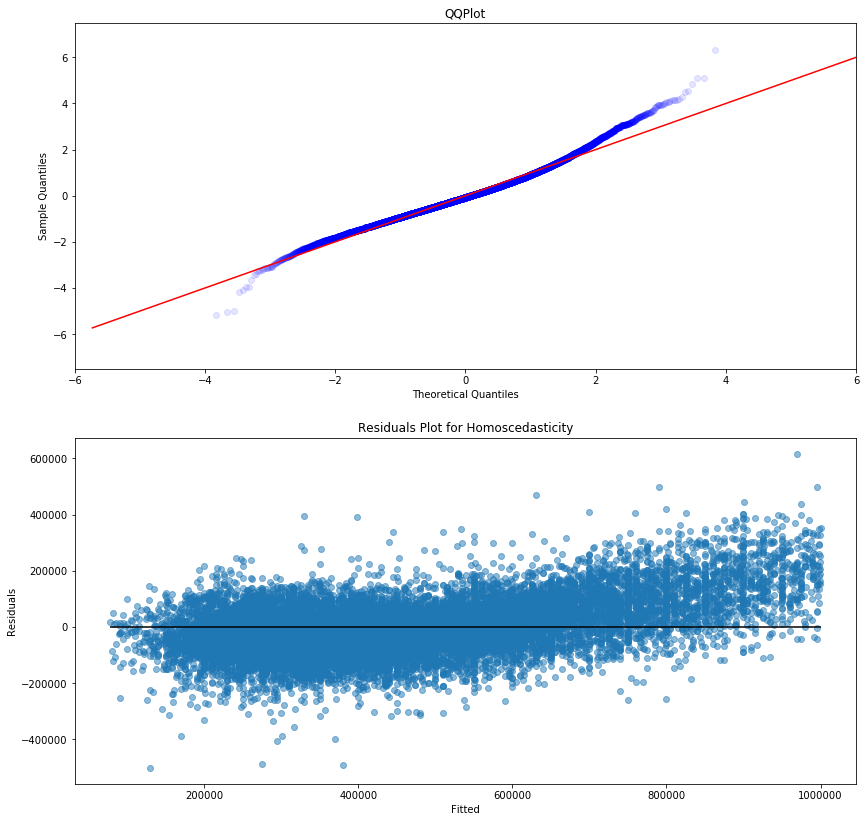

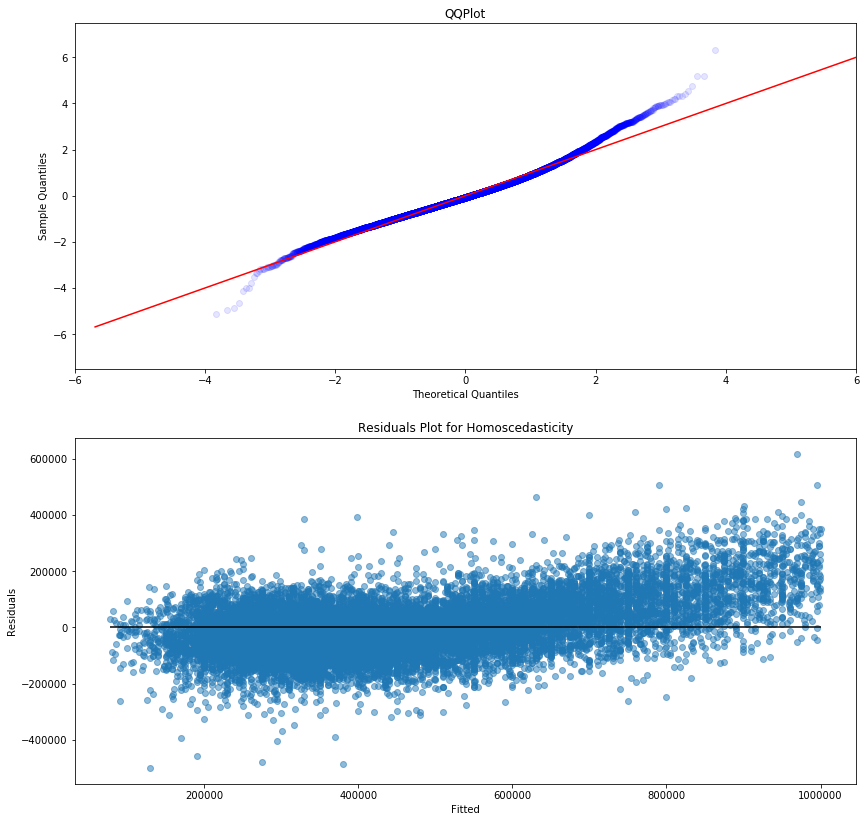

In [23]:
data_t = data_train.copy()
multicollinearity_threshold=0.7
alpha=0.1
cand_log = data_t.drop(['lat', 'long', 'waterfront', 'zipcode'], axis=1).columns

for feat in cand_log:
    data_t = data_train.copy()
    to_log = [feat]
    data_t = log(data_t, to_log)
    x_cols = data_t.drop([outcome], axis=1).columns
    x_cols = multicoll_remove(data_t, x_cols, multicollinearity_threshold)
    x_cols = simple_selector(data_t, x_cols)

    
    results = model(data_t, x_cols)
    if results.rsquared_adj > 0.749:
        metrics(data_t, results, x_cols)
        print(feat)
        print(results.summary())

### Scaled-Log
Again, as above, but transforming with my minmax_plus function first

Number of features: 26
Gate_wo_Building
                            OLS Regression Results                            
Dep. Variable:                  price   R-squared:                       0.753
Model:                            OLS   Adj. R-squared:                  0.753
Method:                 Least Squares   F-statistic:                     1853.
Date:                Tue, 01 Dec 2020   Prob (F-statistic):               0.00
Time:                        10:52:21   Log-Likelihood:            -2.0416e+05
No. Observations:               15824   AIC:                         4.084e+05
Df Residuals:                   15797   BIC:                         4.086e+05
Df Model:                          26                                         
Covariance Type:            nonrobust                                         
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------


Number of features: 28
Public_Gathering
                            OLS Regression Results                            
Dep. Variable:                  price   R-squared:                       0.750
Model:                            OLS   Adj. R-squared:                  0.749
Method:                 Least Squares   F-statistic:                     1688.
Date:                Tue, 01 Dec 2020   Prob (F-statistic):               0.00
Time:                        10:52:23   Log-Likelihood:            -2.0428e+05
No. Observations:               15824   AIC:                         4.086e+05
Df Residuals:                   15795   BIC:                         4.088e+05
Df Model:                          28                                         
Covariance Type:            nonrobust                                         
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------


Number of features: 28
floorsx2
                            OLS Regression Results                            
Dep. Variable:                  price   R-squared:                       0.750
Model:                            OLS   Adj. R-squared:                  0.750
Method:                 Least Squares   F-statistic:                     1696.
Date:                Tue, 01 Dec 2020   Prob (F-statistic):               0.00
Time:                        10:52:26   Log-Likelihood:            -2.0425e+05
No. Observations:               15824   AIC:                         4.086e+05
Df Residuals:                   15795   BIC:                         4.088e+05
Df Model:                          28                                         
Covariance Type:            nonrobust                                         
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
Intercep

Number of features: 28
sqft_living
                            OLS Regression Results                            
Dep. Variable:                  price   R-squared:                       0.764
Model:                            OLS   Adj. R-squared:                  0.764
Method:                 Least Squares   F-statistic:                     1826.
Date:                Tue, 01 Dec 2020   Prob (F-statistic):               0.00
Time:                        10:52:29   Log-Likelihood:            -2.0381e+05
No. Observations:               15824   AIC:                         4.077e+05
Df Residuals:                   15795   BIC:                         4.079e+05
Df Model:                          28                                         
Covariance Type:            nonrobust                                         
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
Inter

Number of features: 29
sqft_lot15
                            OLS Regression Results                            
Dep. Variable:                  price   R-squared:                       0.750
Model:                            OLS   Adj. R-squared:                  0.749
Method:                 Least Squares   F-statistic:                     1630.
Date:                Tue, 01 Dec 2020   Prob (F-statistic):               0.00
Time:                        10:52:30   Log-Likelihood:            -2.0428e+05
No. Observations:               15824   AIC:                         4.086e+05
Df Residuals:                   15794   BIC:                         4.088e+05
Df Model:                          29                                         
Covariance Type:            nonrobust                                         
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
Interc

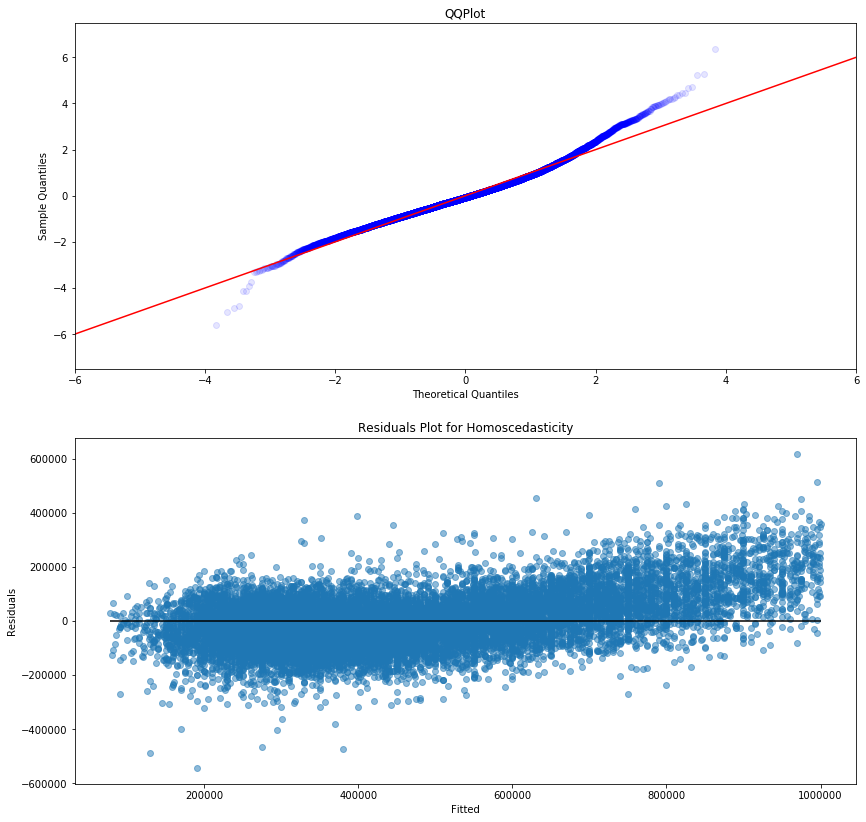

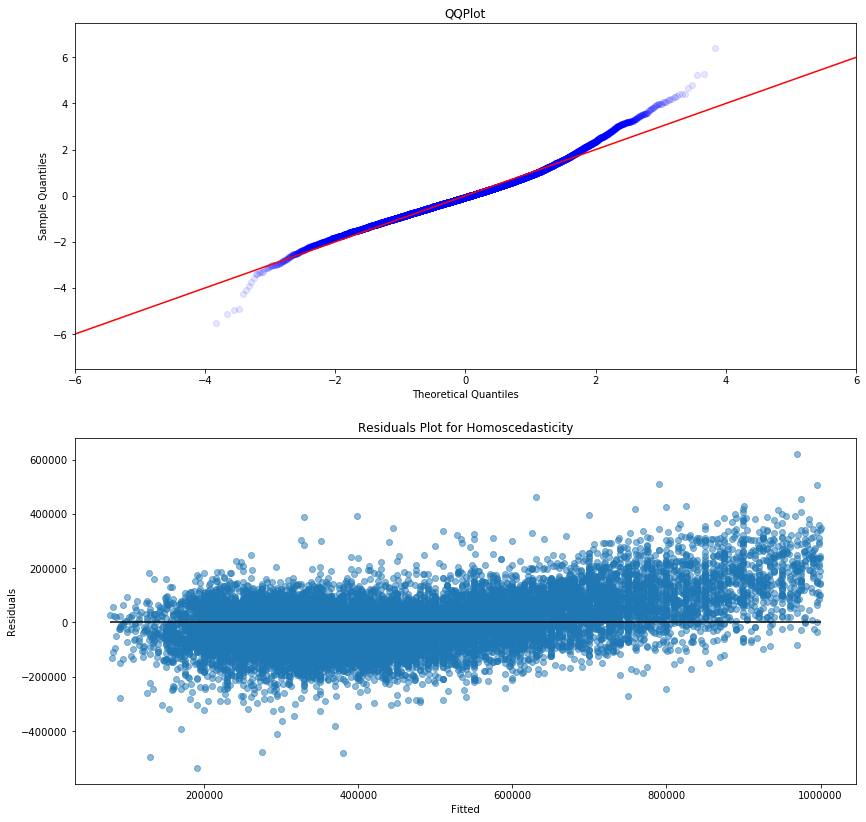

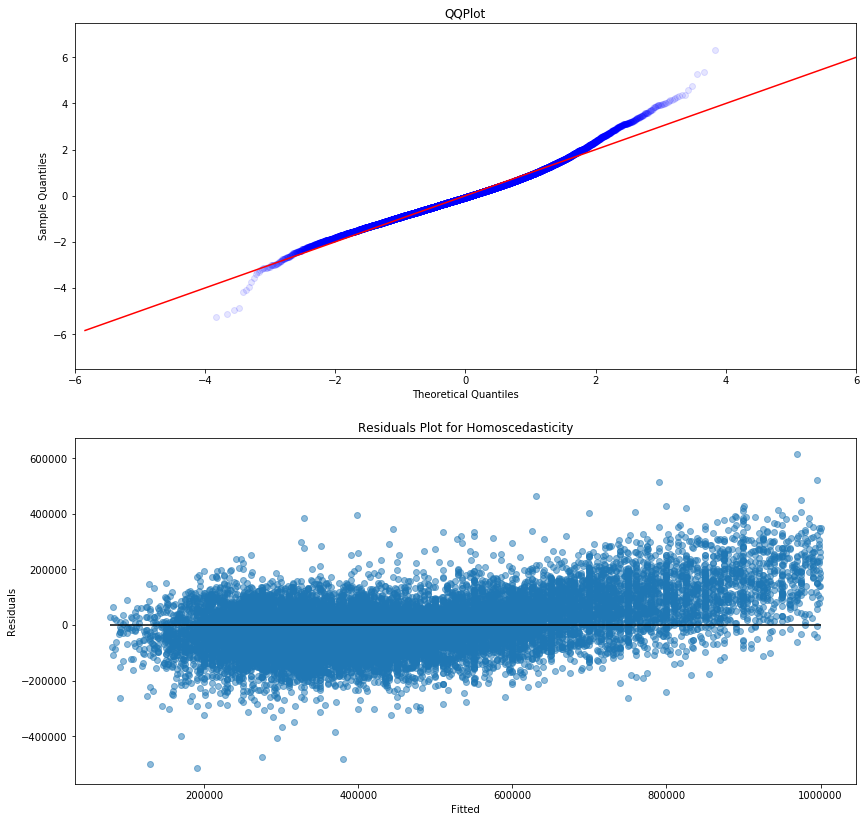

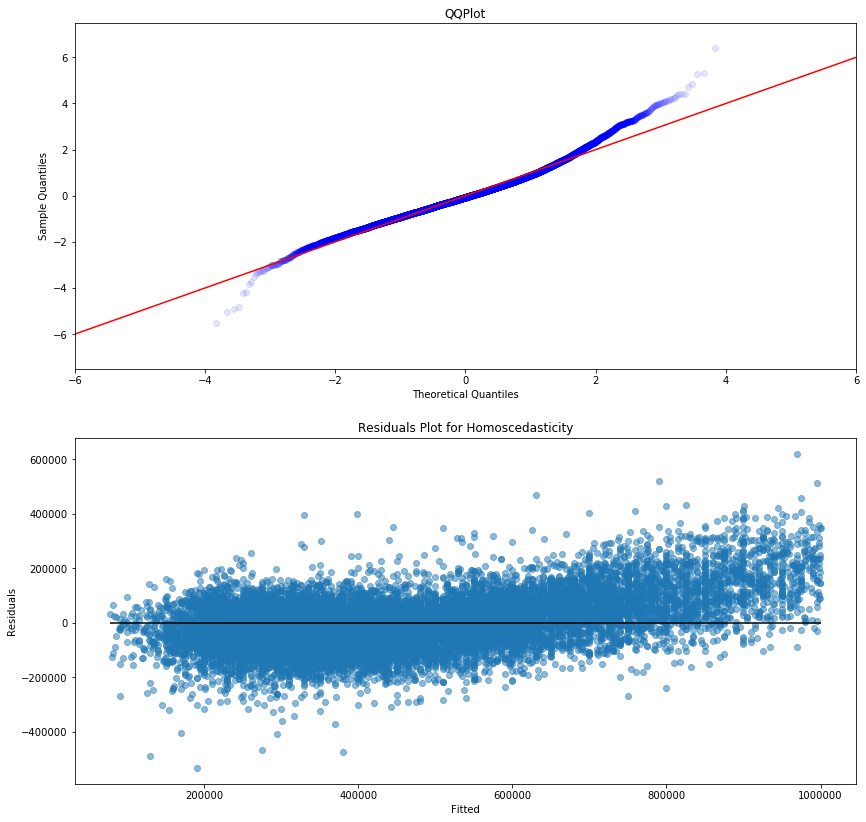

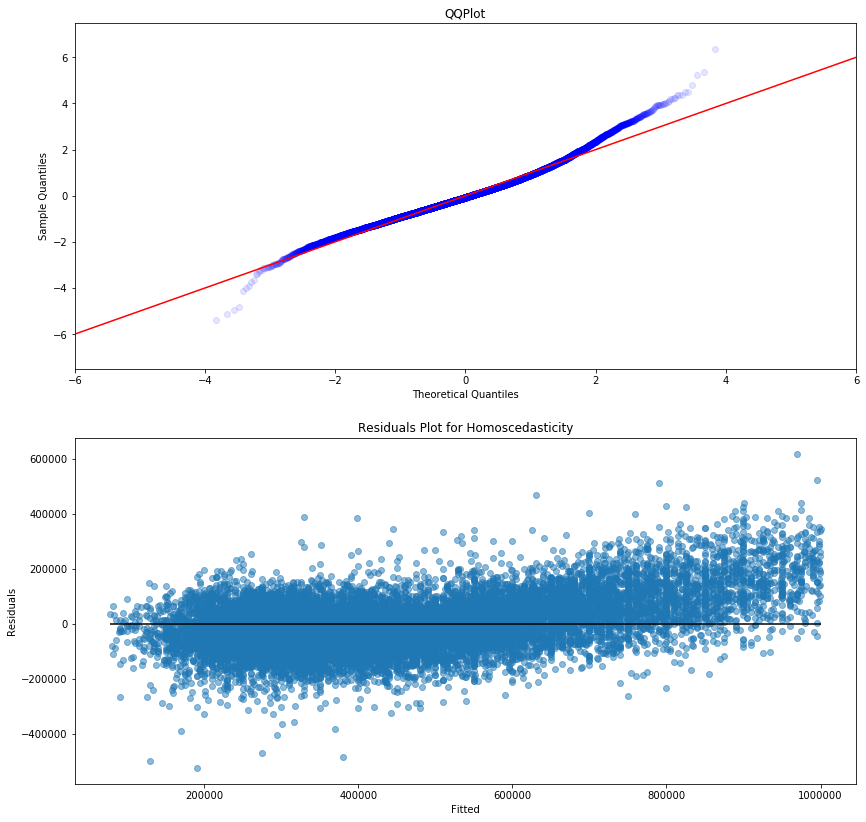

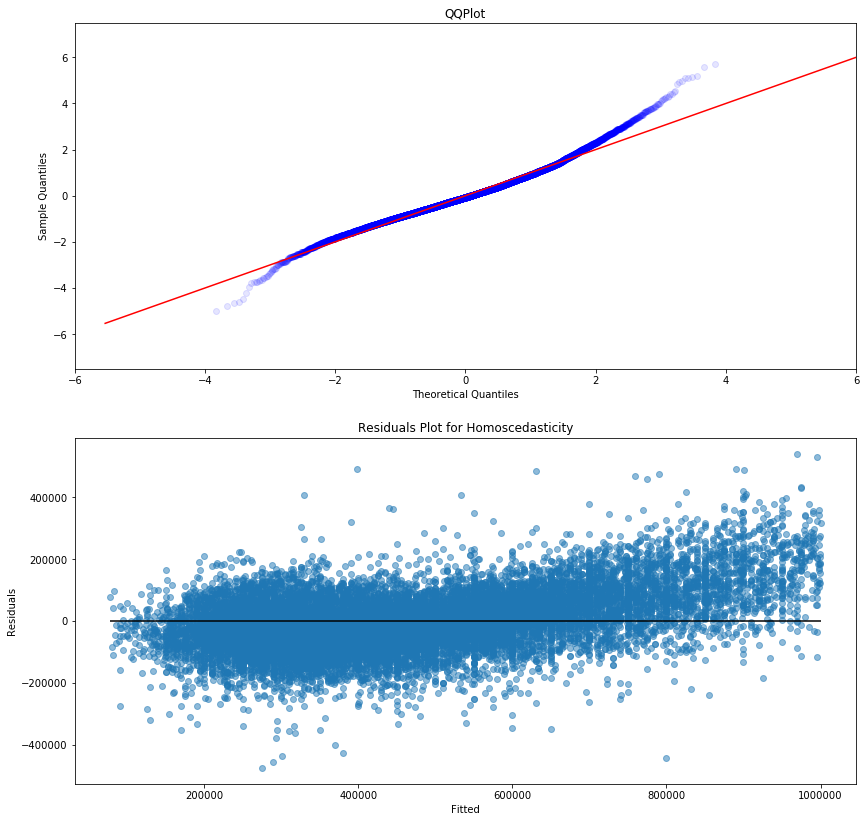

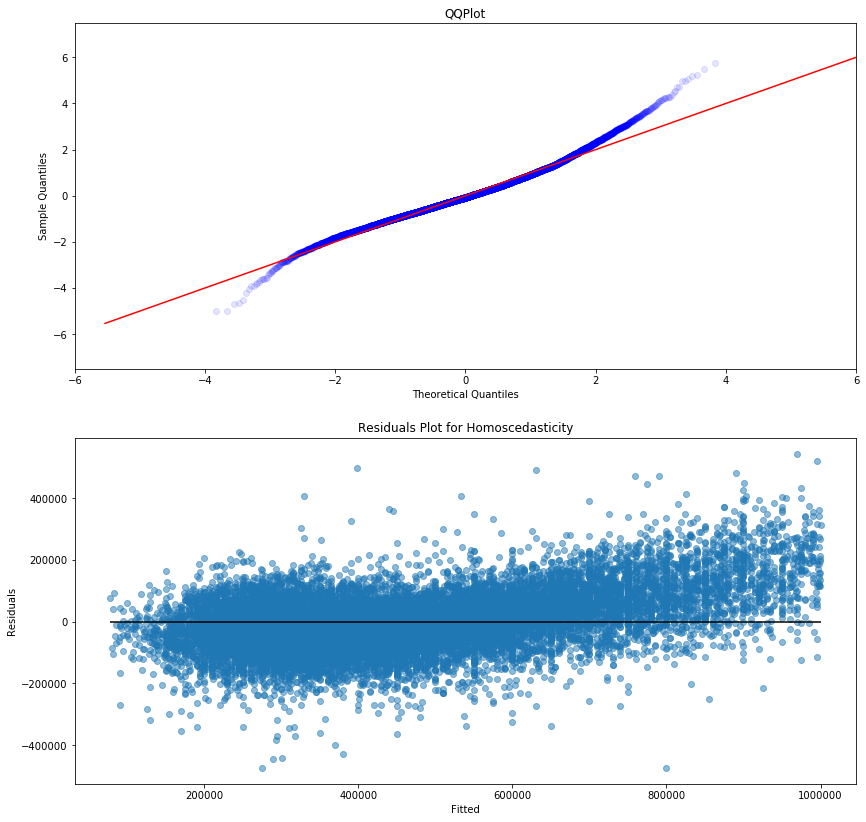

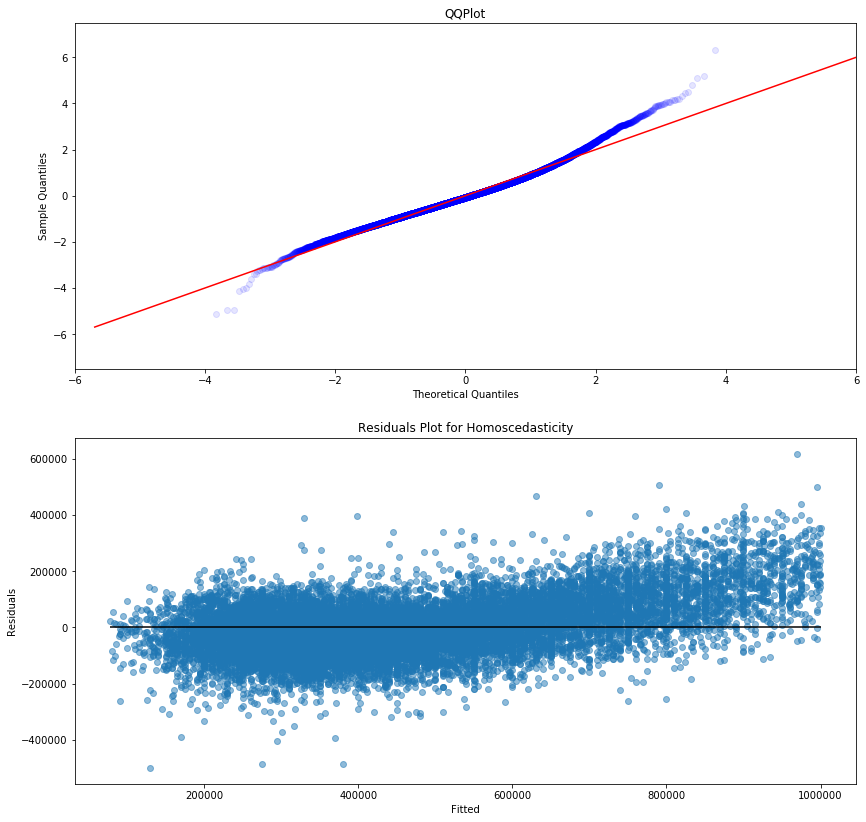

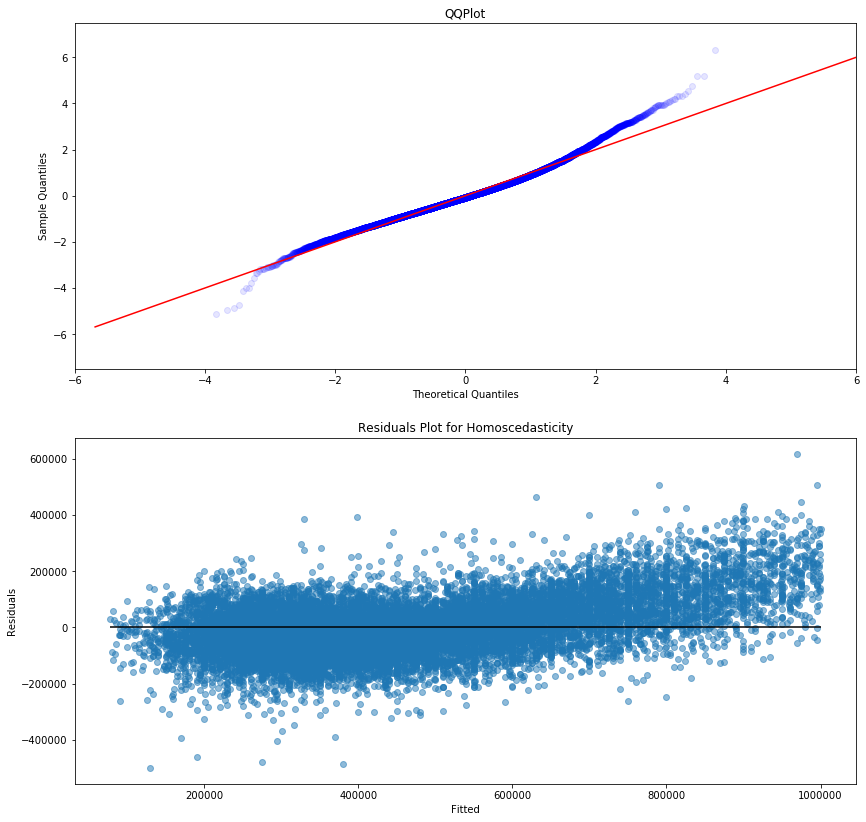

In [24]:
data_t = data_train.copy()
multicollinearity_threshold=0.7
alpha=0.1
cand_log = data_t.drop(['lat', 'long', 'waterfront', 'zipcode'], axis=1).columns

for feat in cand_log:
    data_t = data_train.copy()
    to_log = [feat]
    data_t = minmax_plus(data_t, to_log)
    data_t = log(data_t, to_log)
    x_cols = data_t.drop([outcome], axis=1).columns
    x_cols = multicoll_remove(data_t, x_cols, multicollinearity_threshold)
    x_cols = simple_selector(data_t, x_cols)

    
    results = model(data_t, x_cols)
    
    if results.rsquared_adj > 0.749:
        metrics(data_t, results, x_cols)
        print(feat)
        print(results.summary())

Benefitting from being log transformed are:
 - Gate_wo_building
 - Police
 - Seasonal Home
 - price
 - sqft_lot   
 
Benefitting from being scaled and then log transformed are:
 - sqft_above
 - sqft_living

Number of features: 33


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.771
Model:                            OLS   Adj. R-squared:                  0.771
Method:                 Least Squares   F-statistic:                     1613.
Date:                Tue, 01 Dec 2020   Prob (F-statistic):               0.00
Time:                        10:52:54   Log-Likelihood:                 2402.8
No. Observations:               15824   AIC:                            -4738.
Df Residuals:                   15790   BIC:                            -4477.
Df Model:                          33                                         
Covariance Type:            nonrobust                                         
====================================================================================
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
Intercept            1.1938      4.385      0.272      0.785      -7.402       9.790
sqft_lot             0.0455      0.003     14.942      0.000       0.040       0.052
long                 0.1996      0.021      9.352      0.000       0.158       0.241
lat_long_28         -0.7606      0.084     -9.038      0.000      -0.926      -0.596
lat                  1.5960      0.019     82.731      0.000       1.558       1.634
sqft_basement       -0.0393      0.004     -9.448      0.000      -0.048      -0.031
Lodging              0.0163      0.001     11.799      0.000       0.014       0.019
Campground           0.0097      0.001     16.969      0.000       0.009       0.011
Access_Point        -0.0111      0.001    -18.220      0.000      -0.012      -0.010
grade                0.1350      0.003     51.367      0.000       0.130       0.140
Gated_w_Building     0.0215      0.001     40.449      0.000       0.020       0.023
Airport              0.0020      0.001      3.103      0.002       0.001       0.003
Commercial_Farm     -0.0052      0.001     -5.318      0.000      -0.007      -0.003
lat_long_20         -0.5563      0.211     -2.642      0.008      -0.969      -0.144
yr_built            -0.0019   9.38e-05    -20.354      0.000      -0.002      -0.002
lat_long_14          0.1460      0.015      9.966      0.000       0.117       0.175
view                 0.0444      0.003     14.898      0.000       0.039       0.050
Abandoned           -0.0118      0.001    -14.918      0.000      -0.013      -0.010
lat_long_27         -0.5710      0.100     -5.716      0.000      -0.767      -0.375
bedrooms             0.0237      0.002     10.328      0.000       0.019       0.028
lat_long_3          -0.2018      0.017    -11.758      0.000      -0.235      -0.168
floorsx2             0.0334      0.002     14.060      0.000       0.029       0.038
Police               0.0587      0.003     18.788      0.000       0.053       0.065
lat_long_25         -1.0237      0.153     -6.682      0.000      -1.324      -0.723
Utility              0.0101      0.004      2.721      0.007       0.003       0.017
waterfront           0.3995      0.034     11.595      0.000       0.332       0.467
Government          -0.0177      0.002     -7.285      0.000      -0.022      -0.013
sqft_living15        0.0002   4.34e-06     37.859      0.000       0.000       0.000
bathroomsx4          0.0227      0.001     23.530      0.000       0.021       0.025
Cultural             0.0182      0.001     13.096      0.000       0.015       0.021
Public_Gathering    -0.0105      0.003     -3.269      0.001      -0.017      -0.004
condition            0.0600      0.003     21.349      0.000       0.055       0.066
zipcode             -0.0004   4.27e-05     -9.220      0.000      -0.000      -0.000
date                 0.

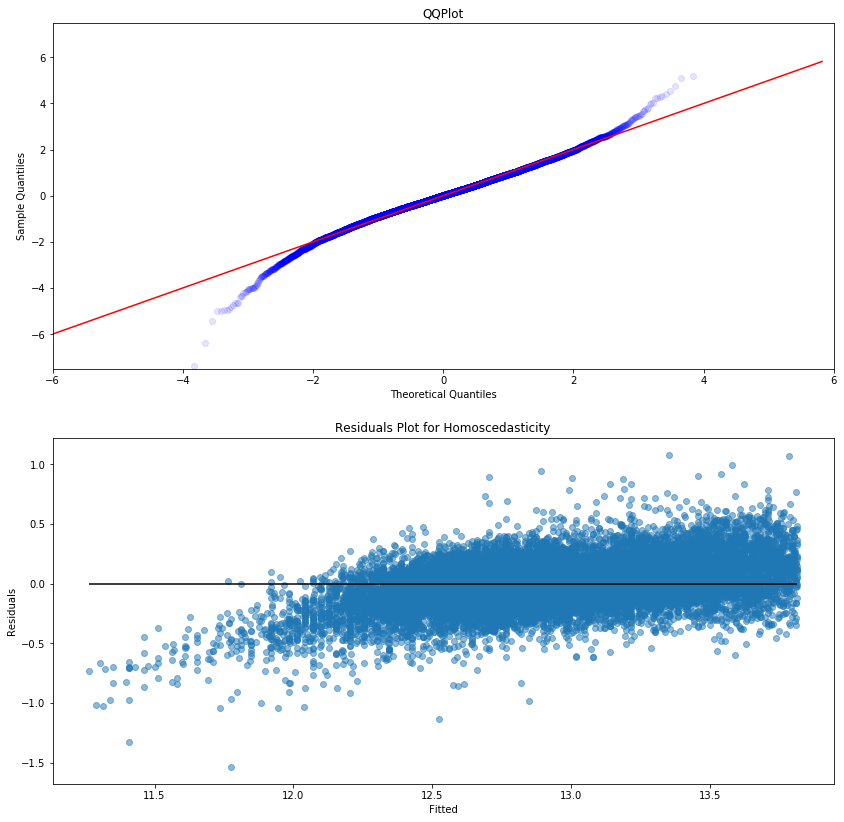

In [25]:
# Model so far:
multicollinearity_threshold=0.7
alpha=0.1
to_minmax = ['sqft_above', 'sqft_living']
to_log = ['Gate_wo_Building', 'Police', 'Seasonal_Home', 'price', 'sqft_lot']
to_ohe = ['lat_long']
          
data_t = data_train.copy()
data_t = bin_basement(data_t)
data_t = minmax_plus(data_t, to_minmax)
data_t = log(data_t, to_log)
data_t = bin_latlong(data_t)
data_t = ohe(data_t, to_ohe)

x_cols = data_t.drop([outcome], axis=1).columns
x_cols = multicoll_remove(data_t, x_cols, multicollinearity_threshold)
x_cols = simple_selector(data_t, x_cols)

results = model(data_t, x_cols)
metrics(data_t, results, x_cols)
results.summary()

Number of features: 33


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.771
Model:                            OLS   Adj. R-squared:                  0.771
Method:                 Least Squares   F-statistic:                     1613.
Date:                Tue, 01 Dec 2020   Prob (F-statistic):               0.00
Time:                        10:53:00   Log-Likelihood:                 2402.8
No. Observations:               15824   AIC:                            -4738.
Df Residuals:                   15790   BIC:                            -4477.
Df Model:                          33                                         
Covariance Type:            nonrobust                                         
====================================================================================
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
Intercept            1.1938      4.385      0.272      0.785      -7.402       9.790
sqft_lot             0.0455      0.003     14.942      0.000       0.040       0.052
long                 0.1996      0.021      9.352      0.000       0.158       0.241
lat_long_28         -0.7606      0.084     -9.038      0.000      -0.926      -0.596
lat                  1.5960      0.019     82.731      0.000       1.558       1.634
sqft_basement       -0.0393      0.004     -9.448      0.000      -0.048      -0.031
Lodging              0.0163      0.001     11.799      0.000       0.014       0.019
Campground           0.0097      0.001     16.969      0.000       0.009       0.011
Access_Point        -0.0111      0.001    -18.220      0.000      -0.012      -0.010
grade                0.1350      0.003     51.367      0.000       0.130       0.140
Gated_w_Building     0.0215      0.001     40.449      0.000       0.020       0.023
Airport              0.0020      0.001      3.103      0.002       0.001       0.003
Commercial_Farm     -0.0052      0.001     -5.318      0.000      -0.007      -0.003
lat_long_20         -0.5563      0.211     -2.642      0.008      -0.969      -0.144
yr_built            -0.0019   9.38e-05    -20.354      0.000      -0.002      -0.002
lat_long_14          0.1460      0.015      9.966      0.000       0.117       0.175
view                 0.0444      0.003     14.898      0.000       0.039       0.050
Abandoned           -0.0118      0.001    -14.918      0.000      -0.013      -0.010
lat_long_27         -0.5710      0.100     -5.716      0.000      -0.767      -0.375
bedrooms             0.0237      0.002     10.328      0.000       0.019       0.028
lat_long_3          -0.2018      0.017    -11.758      0.000      -0.235      -0.168
floorsx2             0.0334      0.002     14.060      0.000       0.029       0.038
Police               0.0587      0.003     18.788      0.000       0.053       0.065
lat_long_25         -1.0237      0.153     -6.682      0.000      -1.324      -0.723
Utility              0.0101      0.004      2.721      0.007       0.003       0.017
waterfront           0.3995      0.034     11.595      0.000       0.332       0.467
Government          -0.0177      0.002     -7.285      0.000      -0.022      -0.013
sqft_living15        0.0002   4.34e-06     37.859      0.000       0.000       0.000
bathroomsx4          0.0227      0.001     23.530      0.000       0.021       0.025
Cultural             0.0182      0.001     13.096      0.000       0.015       0.021
Public_Gathering    -0.0105      0.003     -3.269      0.001      -0.017      -0.004
condition            0.0600      0.003     21.349      0.000       0.055       0.066
zipcode             -0.0004   4.27e-05     -9.220      0.000      -0.000      -0.000
date                 0.

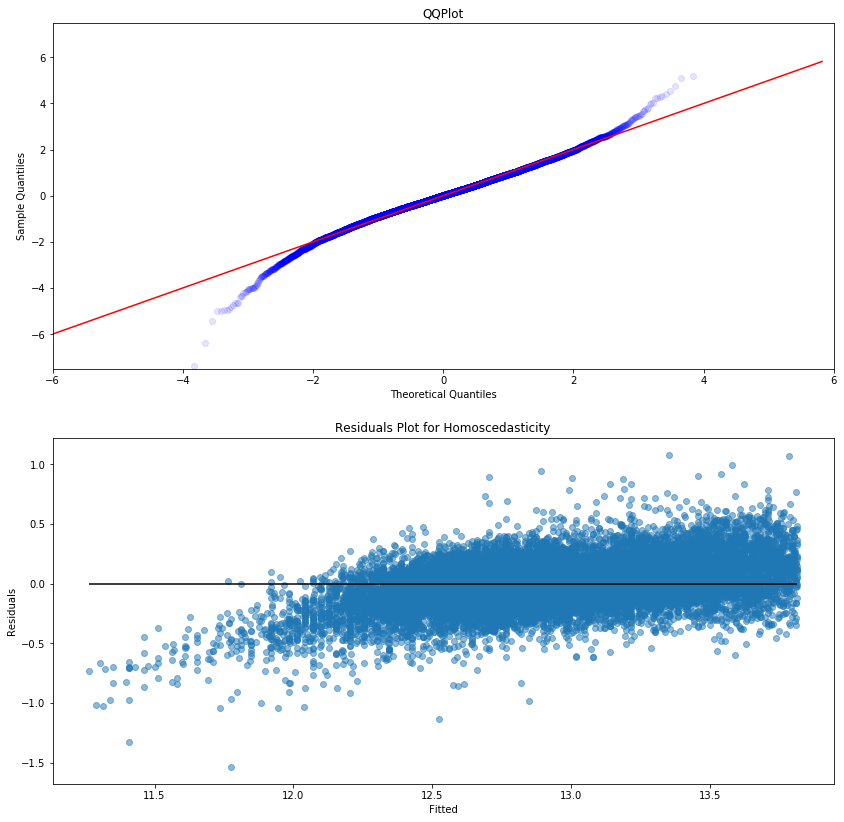

In [26]:
# Model so far:
multicollinearity_threshold=0.7
alpha=0.1
to_minmax = ['sqft_above', 'sqft_living']
to_log = ['Gate_wo_Building', 'Police', 'Seasonal_Home', 'price', 'sqft_lot']
to_ohe = ['lat_long']

#Transformation
data_t = data_train.copy()
data_t = bin_basement(data_t)
data_t = minmax_plus(data_t, to_minmax)
data_t = log(data_t, to_log)
data_t = bin_latlong(data_t)
data_t = ohe(data_t, to_ohe)

#Feature selection
x_cols = data_t.drop([outcome], axis=1).columns
x_cols = multicoll_remove(data_t, x_cols, multicollinearity_threshold)
x_cols = simple_selector(data_t, x_cols)

results = model(data_t, x_cols)
metrics(data_t, results, x_cols)
results.summary()

###  Polynomial Transform and Advanced Feature Selection
Next I tried adding polynomial and interaction terms using the polynomial function. I tried different scaling methods and different orders.    
After which I had many more features to narrow down. First I funnelled down the features through gradually stricter simple selection and multicollinear removal. I then pass through stepwise selection and finally through RFE.      
I settled on the model you see below:

410000.0
410000.0
12.92391243868049
86


C:\Users\Maltanno\anaconda3\envs\learn-env\lib\site-packages\numpy\core\fromnumeric.py:2580: FutureWarning: Method .ptp is deprecated and will be removed in a future version. Use numpy.ptp instead.
  return ptp(axis=axis, out=out, **kwargs)


85
84
83
82
81
80
79
[(1, 0.36664327006399045), (2, 0.5686740845711282), (3, 0.6340010863654886), (4, 0.6579308491919927), (5, 0.7105302352901222), (6, 0.7432287483856721), (7, 0.7456961500932504), (8, 0.7463173693770042), (9, 0.7489009922526184), (10, 0.751970362845469), (11, 0.765455144238558), (12, 0.7744104150583462), (13, 0.7783508247885412), (14, 0.7807577662771288), (15, 0.7826323528754701), (16, 0.7870590342980839), (17, 0.7893796251981695), (18, 0.7905119831809312), (19, 0.7941023770226117), (20, 0.794117285279016), (21, 0.7949435726893987), (22, 0.7968113129163236), (23, 0.7979222065087225), (24, 0.7991955047070447), (25, 0.800360020763174), (26, 0.800931337802492), (27, 0.8016895668934931), (28, 0.801866057314359), (29, 0.8027068444548443), (30, 0.8029506406354711), (31, 0.80315004381728), (32, 0.8033684337690765), (33, 0.8034067680734317), (34, 0.8034927667582451), (35, 0.803772358839361), (36, 0.8038912943123171), (37, 0.8039707017658178), (38, 0.8040270076372182), (39, 0.

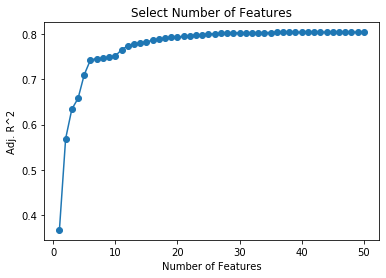

Select number of features
13
12.92391243868049
Number of features: 13


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.779
Model:                            OLS   Adj. R-squared:                  0.778
Method:                 Least Squares   F-statistic:                     4275.
Date:                Tue, 01 Dec 2020   Prob (F-statistic):               0.00
Time:                        10:55:42   Log-Likelihood:                 2661.3
No. Observations:               15824   AIC:                            -5295.
Df Residuals:                   15810   BIC:                            -5187.
Df Model:                          13                                         
Covariance Type:            nonrobust                                         
=================================================================================================
                                    coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
Intercept                        12.9606      0.002   7968.338      0.000      12.957      12.964
lat                               0.1703      0.003     57.355      0.000       0.164       0.176
Airport__Gate_wo_Building         0.1179      0.005     25.718      0.000       0.109       0.127
grade                             0.1130      0.002     48.573      0.000       0.108       0.118
Gate_wo_Building_pow_2           -0.1709      0.004    -42.642      0.000      -0.179      -0.163
Access_Point__view                0.0518      0.002     30.615      0.000       0.048       0.055
Access_Point__Campground         -0.1161      0.003    -41.233      0.000      -0.122      -0.111
Airport__Campground              -0.0951      0.005    -19.631      0.000      -0.105      -0.086
Campground__Seasonal_Home         0.1131      0.006     18.843      0.000       0.101       0.125
Gate_wo_Building__sqft_living     0.1666      0.002     74.943      0.000       0.162       0.171
Cultural_pow_2                    0.0330      0.002     16.795      0.000       0.029       0.037
Campground__Gated_w_Building      0.1802      0.003     62.202      0.000       0.175       0.186
condition                         0.0417      0.002     24.894      0.000       0.038       0.045
Access_Point__Airport            -0.0563      0.003    -16.786      0.000      -0.063      -0.050
==============================================================================
Omnibus:                      713.353   Durbin-Watson:                   2.024
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             2371.296
Skew:                          -0.100   Prob(JB):                         0.00
Kurtosis:                       4.886   Cond. No.                         10.1
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

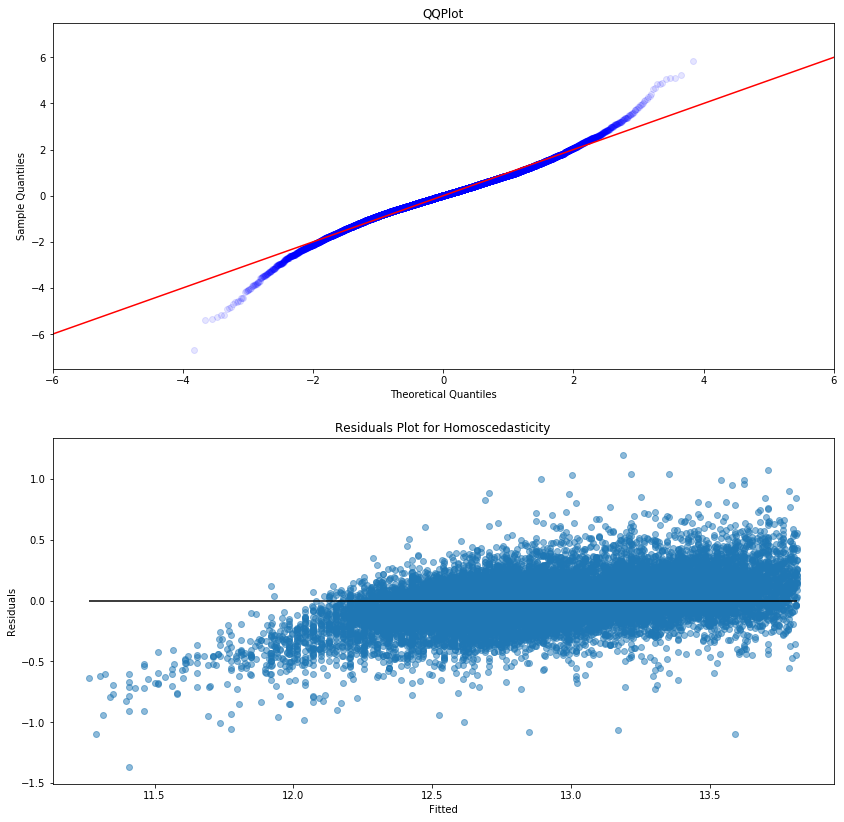

In [27]:
### multicollinearity_threshold=0.7
alpha=0.1
data_t = data_train.copy()

to_minmax = ['sqft_above', 'sqft_living']
to_log = ['Gate_wo_Building', 'Police', 'Seasonal_Home', 'price', 'sqft_lot']
to_ohe = ['lat_long']
to_poly = data_t.drop(['lat', 'long', 'waterfront', 'zipcode', 
                       'price'], axis=1).columns
#Transformation
print(data_t.price[0])
data_t = bin_basement(data_t)
data_t = minmax_plus(data_t, to_poly)
print(data_t.price[0])
data_t = log(data_t, to_log)
print(data_t.price[0])
data_t = polynom(data_t, to_poly)
data_t = bin_latlong(data_t)
data_t = ohe(data_t, to_ohe)
x_cols = data_t.drop([outcome], axis=1).columns

#Feature selection
x_cols = simple_selector(data_t, x_cols, alpha=0.15)
x_cols = multicoll_remove(data_t, x_cols, 0.85)
x_cols = simple_selector(data_t, x_cols, alpha=0.1)
x_cols = multicoll_remove(data_t, x_cols, 0.8)
x_cols = stepwise_selector(data_t, x_cols, alpha=0.05)
x_cols = multicoll_remove(data_t, x_cols, 0.7)
data_t = data_t[['price'] + x_cols]
data_t = norm(data_t, x_cols)
x_cols = rfe_selector(data_t, x_cols)


data_t = data_t[['price'] + x_cols]
data_t = data_t.sort_index(axis=1)

print(data_t.price[0])

results = model(data_t, x_cols)
metrics(data_t, results, x_cols)
results.summary()

### Test Data
Next I run the test data through the same transformations and use the model to predict prices

In [28]:
multicollinearity_threshold=0.7
alpha=0.1
data_tt = data_test.copy()
test = True

to_minmax = ['sqft_above', 'sqft_living']
to_log = ['Gate_wo_Building', 'Police', 'Seasonal_Home', 'price', 'sqft_lot']
to_ohe = ['lat_long']
to_poly = data_tt.drop(['lat', 'long', 'waterfront', 'zipcode', 'price'], axis=1).columns

print(data_tt.price[0])
data_tt = bin_basement(data_tt)
data_tt = minmax_plus(data_tt, to_minmax, test)
print(data_tt.price[0])
data_tt = log(data_tt, to_log)
print(data_tt.price[0])
data_tt = polynom(data_tt, to_poly)
data_tt = bin_latlong(data_tt, test)
data_tt = ohe(data_tt, to_ohe)


#test set may be missing dummies which the model looks for:
missing = list(set(x_cols) -set(list(data_tt.columns)))
for m in missing:
    data_tt[m] = 0
data_tt = data_tt[['price'] + x_cols]
data_tt = data_tt.sort_index(axis=1)
data_tt = norm(data_tt, x_cols, test)
print(data_tt.price[0])

# results 
# metrics(data_tt, results, x_cols)
# results.summary()

462608.0
462608.0
13.044635322188094
13.044635322188094


In [29]:
y_hat_train = results.predict(data_t)
rmse_train = MSE(unlog(data_t.price), unlog(y_hat_train))**0.5
y_hat_test = results.predict(data_tt)
rmse_test = MSE(unlog(data_tt.price), unlog(y_hat_test))**0.5
print(f'Train RMSE: {rmse_train} \n Test RMSE: {rmse_test}')

Train RMSE: 98204.73789179057 
 Test RMSE: 284991.1999283676


Train RMSE is ok but Test RMSE is terrible.
One thing I wanted to look at was mapping the error, so I decided to try it without any using lat, long, or zipcode:

410000.0
410000.0
12.92391243868049
81


C:\Users\Maltanno\anaconda3\envs\learn-env\lib\site-packages\numpy\core\fromnumeric.py:2580: FutureWarning: Method .ptp is deprecated and will be removed in a future version. Use numpy.ptp instead.
  return ptp(axis=axis, out=out, **kwargs)


80
79
78
77
76
75
74
73
72
71
70
69
[(1, 0.2569593447972993), (2, 0.36838095589019426), (3, 0.5444739413210771), (4, 0.5447101576390272), (5, 0.5878954833579583), (6, 0.6278038767486371), (7, 0.667976436129383), (8, 0.6937160662696755), (9, 0.7015804148614089), (10, 0.7179741187659758), (11, 0.7293423744908962), (12, 0.740947266935674), (13, 0.7444046144017487), (14, 0.747235813866205), (15, 0.749595910067351), (16, 0.7547647452498605), (17, 0.7557492317741797), (18, 0.7572268194860452), (19, 0.7578243045966551), (20, 0.7600540968130227), (21, 0.7613531700434697), (22, 0.7618075881513494), (23, 0.7627143058672122), (24, 0.7632020399000459), (25, 0.7637783753877778), (26, 0.7652099575415161), (27, 0.7653640059015249), (28, 0.7656209089136893), (29, 0.7663371694641887), (30, 0.7666022906970615), (31, 0.7668995763700552), (32, 0.7670969330505077), (33, 0.76732043271017), (34, 0.7675127175423846), (35, 0.7676832468510096), (36, 0.7676992921757868), (37, 0.7677695176400935), (38, 0.76784059

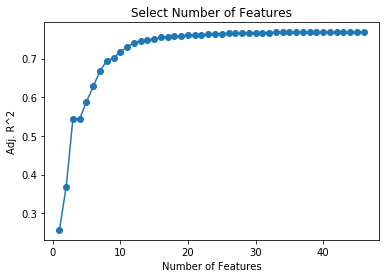

Select number of features
12
12.92391243868049
Number of features: 12


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.741
Model:                            OLS   Adj. R-squared:                  0.741
Method:                 Least Squares   F-statistic:                     3772.
Date:                Tue, 01 Dec 2020   Prob (F-statistic):               0.00
Time:                        10:56:57   Log-Likelihood:                 1427.0
No. Observations:               15824   AIC:                            -2828.
Df Residuals:                   15811   BIC:                            -2728.
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
=================================================================================================
                                    coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
Intercept                        12.9606      0.002   7370.665      0.000      12.957      12.964
grade                             0.0956      0.002     38.554      0.000       0.091       0.101
Gate_wo_Building_pow_2           -0.3300      0.003   -101.152      0.000      -0.336      -0.324
condition__sqft_living15          0.0811      0.002     36.044      0.000       0.077       0.085
Gated_w_Building__Police          0.0645      0.002     30.062      0.000       0.060       0.069
Access_Point__view                0.0492      0.002     26.633      0.000       0.046       0.053
Campground__Gate_wo_Building      0.4026      0.005     85.362      0.000       0.393       0.412
Access_Point__Campground         -0.0851      0.002    -37.080      0.000      -0.090      -0.081
Airport__Campground              -0.1418      0.005    -28.531      0.000      -0.152      -0.132
Airport__Seasonal_Home            0.1722      0.004     44.103      0.000       0.165       0.180
Gate_wo_Building__sqft_living     0.1381      0.003     53.521      0.000       0.133       0.143
Abandoned__Police                -0.0546      0.002    -25.739      0.000      -0.059      -0.050
Airport__Cemetery                -0.0733      0.003    -23.799      0.000      -0.079      -0.067
==============================================================================
Omnibus:                      946.460   Durbin-Watson:                   2.001
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             4227.105
Skew:                           0.019   Prob(JB):                         0.00
Kurtosis:                       5.532   Cond. No.                         7.30
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

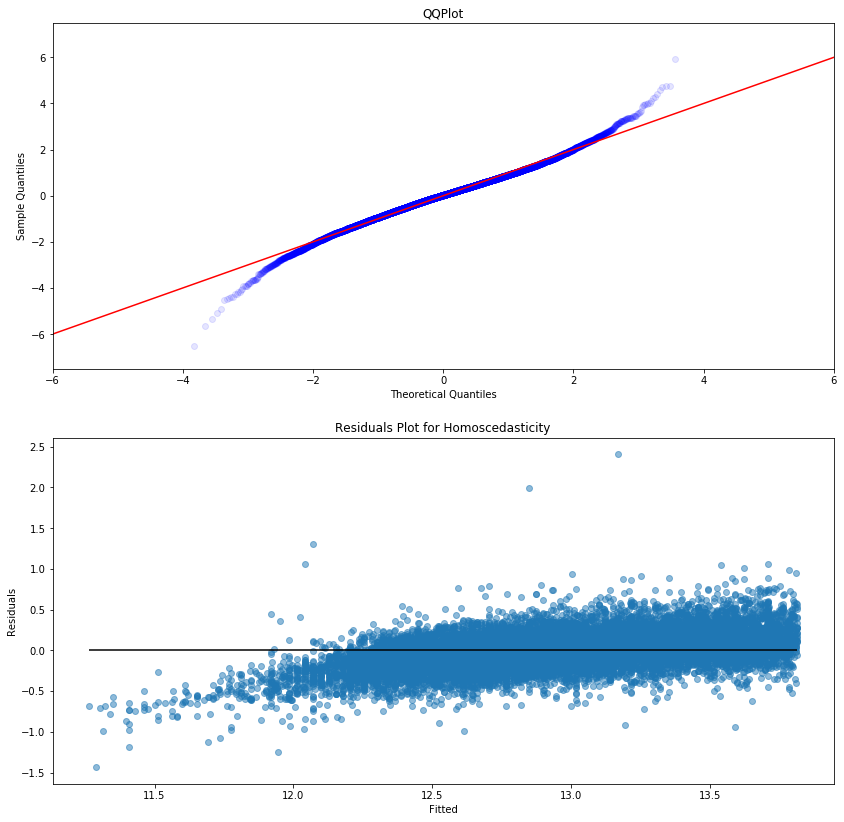

In [30]:
#model with no position:
multicollinearity_threshold=0.7
alpha=0.1
data_t = data_train.copy()

data_t = data_t.drop(['lat', 'long', 'zipcode'], axis=1)

to_minmax = ['sqft_above', 'sqft_living']
to_log = ['Gate_wo_Building', 'Police', 'Seasonal_Home', 'price', 'sqft_lot']
to_poly = data_t.drop(['waterfront', 
                       'price'], axis=1).columns

print(data_t.price[0])
data_t = bin_basement(data_t)
data_t = minmax_plus(data_t, to_poly)
print(data_t.price[0])
data_t = log(data_t, to_log)
print(data_t.price[0])
data_t = polynom(data_t, to_poly)
x_cols = data_t.drop([outcome], axis=1).columns

x_cols = simple_selector(data_t, x_cols, alpha=0.15)
x_cols = multicoll_remove(data_t, x_cols, 0.85)
x_cols = simple_selector(data_t, x_cols, alpha=0.1)
x_cols = multicoll_remove(data_t, x_cols, 0.8)
x_cols = stepwise_selector(data_t, x_cols, alpha=0.05)
x_cols = multicoll_remove(data_t, x_cols, 0.7)

data_t = data_t[['price'] + x_cols]
data_t = norm(data_t, x_cols)
x_cols = rfe_selector(data_t, x_cols)


data_t = data_t[['price'] + x_cols]
data_t = data_t.sort_index(axis=1)
print(data_t.price[0])

results = model(data_t, x_cols)
metrics(data_t, results, x_cols)
results.summary()

In [31]:
multicollinearity_threshold=0.7
alpha=0.1
data_tt = data_test.copy()
test = True

data_tt = data_tt.drop(['lat', 'long', 'zipcode'], axis=1)

to_minmax = ['sqft_above', 'sqft_living']
to_log = ['Gate_wo_Building', 'Police', 'Seasonal_Home', 'price', 'sqft_lot']
to_poly = data_tt.drop(['waterfront', 
                       'price'], axis=1).columns

print(data_tt.price[0])
data_tt = bin_basement(data_tt)
data_tt = minmax_plus(data_tt, to_poly)
print(data_tt.price[0])
data_tt = log(data_tt, to_log)
print(data_tt.price[0])
data_tt = polynom(data_tt, to_poly)

#test set may be missing dummies which the model looks for:
missing = list(set(x_cols) -set(list(data_tt.columns)))
for m in missing:
    data_tt[m] = 0
print(data_tt.price[0])
data_tt = data_tt[['price'] + x_cols]
data_tt = data_tt.sort_index(axis=1)
data_tt = norm(data_tt, x_cols, test)
print(data_tt.price[0])

462608.0
462608.0
13.044635322188094
13.044635322188094
13.044635322188094


In [32]:
y_hat_train = results.predict(data_t)
rmse_train = MSE(unlog(data_t.price), unlog(y_hat_train))**0.5
y_hat_test = results.predict(data_tt)
rmse_test = MSE(unlog(data_tt.price), unlog(y_hat_test))**0.5
print(f'Train RMSE: {rmse_train} \n Test RMSE: {rmse_test}')

Train RMSE: 104126.96359716072 
 Test RMSE: 118296.45508329422


Although the Train RMSE is a bit worse, the Test RMSE is much better.       
We have our final model.    
But first let's just check the basemodel's RMSEs:

Number of features: 36
Train RMSE: 90503.58916320122 
 Test RMSE: 92445.73893425212


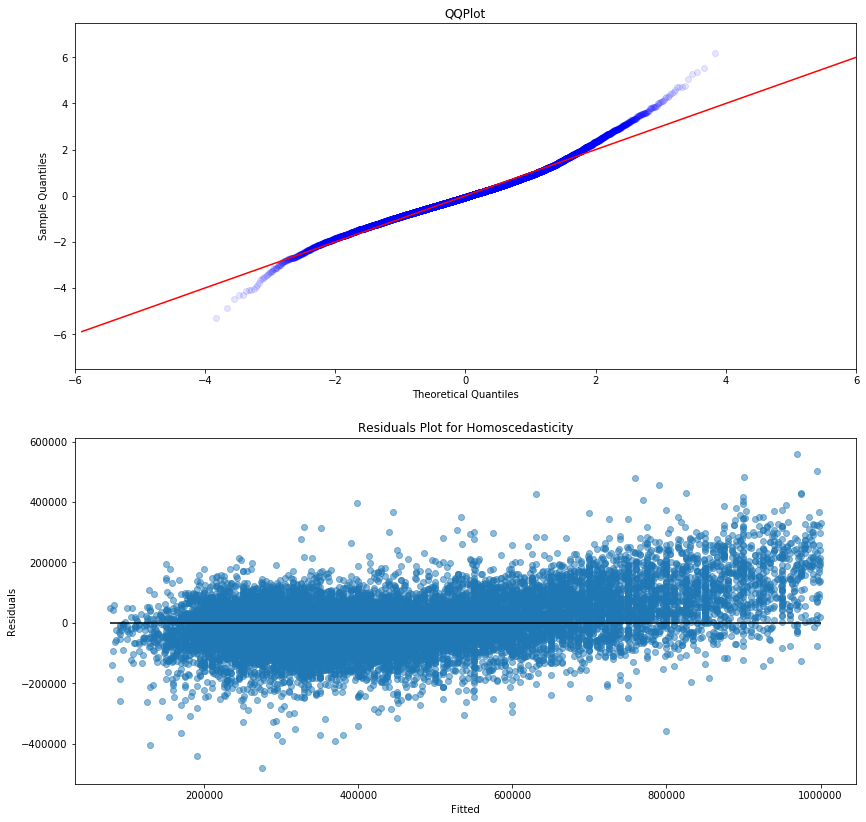

In [33]:
outcome = 'price'
x_cols = data_train.drop([outcome], axis=1).columns
results = model(data_train, x_cols)

metrics(data_train, results, x_cols)
results.summary()

y_hat_train = results.predict(data_train)
rmse_train = MSE(data_train.price, y_hat_train)**0.5
y_hat_test = results.predict(data_test)
rmse_test = MSE(data_test.price, y_hat_test)**0.5
print(f'Train RMSE: {rmse_train} \n Test RMSE: {rmse_test}')

With much better RMSEs (and time running out) we're going to go ahead with the base model

### Creating an Error Map
First I add the predictions to the dataframe, then calculate the residuals. Then I create 2 dataframes, with just lat, long and residuals; one for the bottom 25% of residuals and one for the top. Next I find the min and max of each for scaling from 0-255. With these I create a colour column. I then use Folium to create a map from these

In [34]:
data_r = pd.concat([data_train, y_hat_train], axis=1)
data_r.rename(columns={0:'residuals'}, inplace=True)
data_r.residuals = data_r.price - data_r.residuals
data_r  = data_r[['lat', 'long', 'residuals']]
data_ra = data_r[data_r.residuals < data_r.residuals.quantile(0.25)]
data_rb = data_r[data_r.residuals > data_r.residuals.quantile(0.75)]
print(len(data_ra), len(data_rb))


3956 3956


In [35]:
minb = data_r.residuals.quantile(0.75)
maxb = data_r.residuals.max()
mina = data_r.residuals.min()
maxa = data_r.residuals.quantile(0.25)


data_rb.loc[:,'colour'] = data_rb.residuals.apply(lambda x: 
                        '#'+str(hex(int(255*(x-minb)/(maxb-minb))))[2:]+'0000')

data_ra.loc[:,'colour'] = data_ra.residuals.apply(lambda x: 
                        '#00ff'+str(hex(int(255*(x-mina)/(maxa-mina))))[2:])

lat = 47.5480
long = -121.9836
base_map = folium.Map([lat,long], zoom_start=9, width=900, height=600)

for df in [data_ra, data_rb]:
    x = df.lat
    y = df.long
    z = df.colour
    points = list(zip(x,y,z))
    for p in points:

        lat = p[0]
        long = p[1]
        marker = folium.CircleMarker(location=[lat,long], radius=2, color=p[2])
        marker.add_to(base_map)   


base_map

C:\Users\Maltanno\anaconda3\envs\learn-env\lib\site-packages\pandas\core\indexing.py:376: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[key] = _infer_fill_value(value)
C:\Users\Maltanno\anaconda3\envs\learn-env\lib\site-packages\pandas\core\indexing.py:494: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[item] = s


Below I do the same again but this time using error/price. I felt that, otherwise, more expensive places could be overrepresented.

In [36]:
data_r = pd.concat([data_train, y_hat_train], axis=1)
data_r.rename(columns={0:'residuals2'}, inplace=True)
data_r.residuals2 = 100*(data_r.price - data_r.residuals2)/data_r.price
data_r  = data_r[['lat', 'long', 'residuals2']]
data_ra = data_r[data_r.residuals2 < data_r.residuals2.quantile(0.25)]
data_rb = data_r[data_r.residuals2 > data_r.residuals2.quantile(0.75)]
print(len(data_ra), len(data_rb))

3956 3956


In [37]:
minb = data_r.residuals2.quantile(0.75)
maxb = data_r.residuals2.max()
mina = data_r.residuals2.min()
maxa = data_r.residuals2.quantile(0.25)

data_rb.loc[:,'colour'] = data_rb.residuals2.apply(lambda x: 
                        '#'+str(hex(int(255*(x-minb)/(maxb-minb))))[2:]+'0000')

data_ra.loc[:,'colour'] = data_ra.residuals2.apply(lambda x: 
                        '#00ff'+str(hex(int(255*(x-mina)/(maxa-mina))))[2:])

lat = 47.5480
long = -121.9836
base_map = folium.Map([lat,long], zoom_start=9, width=900, height=600)

for df in [data_ra, data_rb]:
    x = df.lat
    y = df.long
    z = df.colour
    points = list(zip(x,y,z))
    for p in points:

        lat = p[0]
        long = p[1]
        marker = folium.CircleMarker(location=[lat,long], radius=2, color=p[2])
        marker.add_to(base_map)   


base_map

See README for further results

In [40]:
#Looked briefly at Principal Component Analysis
X = data_train.drop(outcome, axis=1)
pca = PCA(n_components = 4, whiten=True)
pca.fit(X)

PCA(copy=True, iterated_power='auto', n_components=4, random_state=None,
    svd_solver='auto', tol=0.0, whiten=True)

In [41]:
pca.components_

array([[ 1.52468036e-05,  2.86686176e-05,  2.13232862e-05,
        -4.57081712e-05,  2.89475648e-05, -2.97217485e-06,
         1.14721067e-05,  8.10096692e-06,  2.37634892e-06,
        -7.14755565e-05, -1.10071879e-05,  8.65422013e-06,
         1.52861316e-05,  1.38293493e-05,  7.94006204e-06,
        -6.94643498e-05,  1.91875051e-06,  6.24200061e-06,
         1.93787646e-06, -5.01264815e-09, -5.68862302e-06,
        -2.51838539e-06,  3.99708883e-06, -3.84474495e-07,
         1.35827512e-06,  4.65912766e-03,  4.86304297e-04,
         5.13205168e-03,  4.15673313e-03,  9.65553091e-01,
         2.60079912e-01,  1.06668393e-06,  1.13582801e-07,
         3.26144027e-05,  2.95071046e-05, -3.01779514e-04],
       [-5.96166034e-05, -1.10047018e-04, -8.74784550e-05,
         1.72362527e-04, -8.48943927e-05,  2.73741666e-06,
        -4.12883680e-05, -3.00445452e-05, -1.35988911e-05,
         2.33211088e-04,  4.64266498e-05, -2.91625288e-05,
        -5.75359797e-05, -3.45994436e-05, -2.80479919e-

### Future work
 - Try some minor changes from the base model e.g. some transforms, without feature selection      
 - Add cross validation       
 - Look further into PCA     
 - Add sklearn metric into RFE function       
 - Find how to get more data from the API      
 - If we could get the same data over a longer time, it would be interesting to see how the error map changes
 - Try a narrower range of prices